# Project 3 - Road Segmentation

### ETH Computational Intelligence Lab 2021 - Project 3

Disclaimer: The goal of this notebook is not that of directly providing strong off-the-shelf baselines, but we mainly set out to present some (more or less practical) ideas. The methods mentioned here are briefly presented and not optimized. A solid baseline comparison may explore ways to optimize these. 

Image segmentation is a key task in computer vision, with important applications in autonomous driving and medicine, among others. **The goal is to partition an image in subsets of pixels according to their semantic meaning.** If it is true that progress in deep learning was fostered by the availability of large datasets\[1\] and relevant benchmarks, it is no doubt that image segmentation, together with the closely related tasks of image classification and object recognition, has been instrumental to the success of the field.

For the purpose of this project, we will focus in particular on the task of road segmentation. **Given a set of RGB aerial images, we are formally asked to classify each 16x16 pixel patch as either containing road (1) or not (0).** This can be seen as decreasing the resolution of the segmentation task, or as decomposing it into several smaller classification problems.

In this notebook we will first of all load and explore the data. Only then we will present 3 methods that will guide us through an essential recap of the literature. Note that these methods  and are not optimized. They can be adapted and 
improved to be used as baselines, depending on their relevance to your approach.

\\

\[1\] Tsung-Yi, Lin et al. "Microsoft COCO: Common Objects in Context", [arXiv:1405.0312](https://arxiv.org/abs/1405.0312)

# Data Exploration

Observing available data can be a good starting point to become familiar with the problem and identify useful inductive biases.
We are provided with a labeled training set and an (unlabeled, of course) test dataset. The latter is split into a private and a public part, which is something we should keep in mind to avoid overfitting.

The **training dataset** is composed of (only!) 100 RGB images of sizes 400x400 px. It therefore contains 62500 patches in total. The labels for each patch are not explicitly provided. We instead have access to a segmentation mask for each training image. If a pixel in the training image contains road surface, the pixel with the same coordinates in the mask will be set to 1, else it will be set to 0.

In order to define a mapping between segmentation masks and patch labels, we classify a patch as containing road when the average brightness of its segmentation mask is at least 25% of the maximum average brightness. This will correspond to patches that are covered by roads for at least a quarter of their area.

On the other hand, the **test dataset** contains 94 images of size 608x608 px. In this notebook we will assume for simplicity that a training and a test image cover areas of the same size, but we encourage the students to validate this assumption as it might not be correct.

In order to evaluate our methods locally, we will rely on a fixed training/validation split. Please note that the validation metric can be significantly biased due to the single split and the small number of datapoints. It would be wise to use better validation methods. Moreover, you might want to consider training on all of the available data for your final submissions.

**We will now load* the datasets and visualize them briefly.**

***:** unfortunately, the Kaggle API is structured to send individual HTTP requests for each of the files requested. Since we need to download around 300 files from Kaggle, it is very likely that we would run into HTTP 429 errors. For this reason, it is best to **manually [download all](https://www.kaggle.com/c/cil-road-segmentation-2021/data) the datasets as a .zip file** from the website and then upload it to this notebook from the Files tab on the left of this page. Once this is done, we can proceed with the rest of the notebook.

If you are considering to use Colab for your project, it would be faster to save a copy of the datasets directly in your Google Drive folders (or in a git repo) and import them from there.

In [1]:
# some basic imports

import math
import os
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from random import sample
from PIL import Image

In [2]:
# some constants
PATCH_SIZE = 16  # pixels per side of square patches
VAL_SIZE = 10  # size of the validation set (number of images)
CUTOFF = 0.25  # minimum average brightness for a mask patch to be classified as containing road

# unzip the dataset, split it and organize it in folders
if not os.path.isdir('validation'):  # make sure this has not been executed yet
  try:
          !unzip cil-road-segmentation-2021.zip
          !mv training/training/* training
          !rm -rf training/training
          !mkdir validation
          !mkdir validation/images
          !mkdir validation/groundtruth
          for img in sample(glob("training/images/*.png"), VAL_SIZE):
            os.rename(img, img.replace('training', 'validation'))
            mask = img.replace('images', 'groundtruth')
            os.rename(mask, mask.replace('training', 'validation'))
  except:
      print('Please upload a .zip file containing your datasets.')

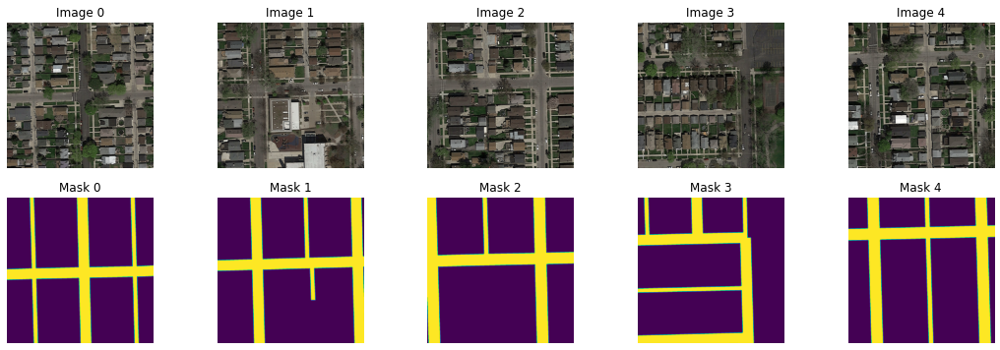

In [3]:
def load_all_from_path(path):
    # loads all HxW .pngs contained in path as a 4D np.array of shape (n_images, H, W, 3)
    # images are loaded as floats with values in the interval [0., 1.]
    return np.stack([np.array(Image.open(f)) for f in sorted(glob(path + '/*.png'))]).astype(np.float32) / 255.


def show_first_n(imgs, masks, n=5):
    # visualizes the first n elements of a series of images and segmentation masks
    imgs_to_draw = min(5, len(imgs))
    fig, axs = plt.subplots(2, imgs_to_draw, figsize=(18.5, 6))
    for i in range(imgs_to_draw):
        axs[0, i].imshow(imgs[i])
        axs[1, i].imshow(masks[i])
        axs[0, i].set_title(f'Image {i}')
        axs[1, i].set_title(f'Mask {i}')
        axs[0, i].set_axis_off()
        axs[1, i].set_axis_off()
    plt.show()
    

# paths to training and validation datasets
train_path = 'training'
val_path = 'validation'

train_images = load_all_from_path(os.path.join(train_path, 'images'))
train_masks = load_all_from_path(os.path.join(train_path, 'groundtruth'))
val_images = load_all_from_path(os.path.join(val_path, 'images'))
val_masks = load_all_from_path(os.path.join(val_path, 'groundtruth'))

# visualize a few images from the training set
show_first_n(train_images, train_masks)

We have mentioned that our task can also be seen as a classification problem. Let us visualize how each image can be broken up in patches and how we can compute labels from groundtruth masks.

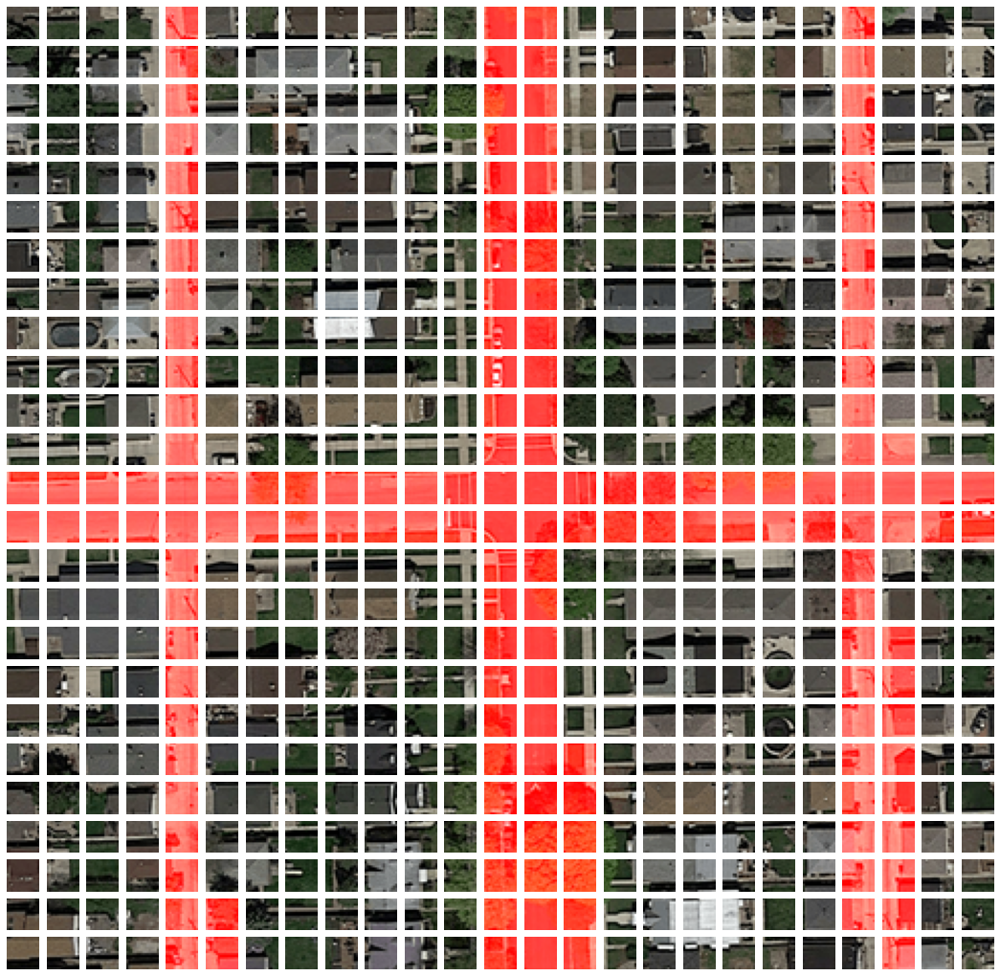

In [4]:
def image_to_patches(images, masks=None):
    # takes in a 4D np.array containing images and (optionally) a 4D np.array containing the segmentation masks
    # returns a 4D np.array with an ordered sequence of patches extracted from the image and (optionally) a np.array containing labels
    n_images = images.shape[0]  # number of images
    h, w = images.shape[1:3]  # shape of images
    assert (h % PATCH_SIZE) + (w % PATCH_SIZE) == 0  # make sure images can be patched exactly

    h_patches = h // PATCH_SIZE
    w_patches = w // PATCH_SIZE
    patches = images.reshape((n_images, h_patches, PATCH_SIZE, h_patches, PATCH_SIZE, -1))
    patches = np.moveaxis(patches, 2, 3)
    patches = patches.reshape(-1, PATCH_SIZE, PATCH_SIZE, 3)
    if masks is None:
        return patches

    masks = masks.reshape((n_images, h_patches, PATCH_SIZE, h_patches, PATCH_SIZE, -1))
    masks = np.moveaxis(masks, 2, 3)
    labels = np.mean(masks, (-1, -2, -3)) > CUTOFF  # compute labels
    labels = labels.reshape(-1).astype(np.float32)
    return patches, labels


def show_patched_image(patches, labels, h_patches=25, w_patches=25):
    # reorders a set of patches in their original 2D shape and visualizes them
    fig, axs = plt.subplots(h_patches, w_patches, figsize=(18.5, 18.5))
    for i, (p, l) in enumerate(zip(patches, labels)):
        # the np.maximum operation paints patches labeled as road red
        axs[i // w_patches, i % w_patches].imshow(np.maximum(p, np.array([l.item(), 0., 0.])))
        axs[i // w_patches, i % w_patches].set_axis_off()
    plt.show()


# extract all patches and visualize those from the first image
train_patches, train_labels = image_to_patches(train_images, train_masks)
val_patches, val_labels = image_to_patches(val_images, val_masks)
# the first image is broken up in the first 25*25 patches
show_patched_image(train_patches[:25*25], train_labels[:25*25])

It appears that the classification task might be **largely unbalanced**. Let us verify it.

In [5]:
print("{0:0.2f}".format(sum(train_labels) / len(train_labels) * 100) + '% of training patches are labeled as 1.')
print("{0:0.2f}".format(sum(val_labels) / len(val_labels) * 100) + '% of validation patches are labeled as 1.')

25.34% of training patches are labeled as 1.
31.01% of validation patches are labeled as 1.


This means that a trivial classifier that always assigns the majority class (0) to each sample would already reach an accuracy of about ~75%. We will observe that reaching such accuracy is already quite a challenge. While entirely possible, it will require many ideas that we will only be able to touch upon.


# Method 1 - Logistic Regression

Prior to the success of neural networks, computer vision largely relied on hand-crafted features or hand-designed filters \[1\].
Our first approach is perhaps the simplest and it builds up on the following assumptions:


1.   the color of roads is quite uniform
2.   the color of roads tends to be consistent across patches

From each patch we can extract a vector of 6 features representing the average value and the variance of each color channel across the patch. We can then train a simple logistic regression \[2\] model to assign a label to each patch.

More formally, we manually design a data matrix $X_{train} = [x_0^T, x_1^T, ..., x_n-1^T] \in R^{m, n}$ where $n$ is the number of patches and $m$ is the number of features extracted. We also have access to a label vector $Y_{train} = [y_0, .., y_n-1]^T$ specifying the correct binary label of each patch. We then model the probability of a patch to contain road surface as
$$P(y_i=1) = h(x_i) = \frac{1}{1 - e^{-x_i^T \theta}}$$

We can finally learn the weight vector $\theta$ by minimizing an empirical estimate of the negative log likelihood or, equivalently, a cross entropy loss function:

$$\theta^\star = argmin{\frac{1}{n} \sum_{i=0}^{n-1}(-y_i \log{(h(x_i))} - (1-y_i)\log{(1- h(x_i))})}$$

\\

\[2\] O' Mahony, Niall et al. "Deep Learning vs. Traditional Computer Vision", 
[arXiv:1910.13796](https://arxiv.org/abs/1910.13796)

\[3\] [Wikipedia](https://en.wikipedia.org/wiki/Logistic_regression) 

In [6]:
def extract_features(x):
    # extracts features from each patch
    return np.concatenate([np.mean(x, (-2, -3)), np.var(x, (-2,-3))], axis=-1)

from sklearn.linear_model import LogisticRegression

train_path = 'training'
val_path = 'validation'

train_images = load_all_from_path(os.path.join(train_path, 'images'))
train_masks = load_all_from_path(os.path.join(train_path, 'groundtruth'))
val_images = load_all_from_path(os.path.join(val_path, 'images'))
val_masks = load_all_from_path(os.path.join(val_path, 'groundtruth'))
train_patches, train_labels = image_to_patches(train_images, train_masks)
val_patches, val_labels = image_to_patches(val_images, val_masks)

x_train = extract_features(train_patches)
x_val = extract_features(val_patches)
clf = LogisticRegression(class_weight='balanced').fit(x_train, train_labels)
print(f'Training accuracy: {clf.score(x_train, train_labels)}')
print(f'Validation accuracy: {clf.score(x_val, val_labels)}')

Training accuracy: 0.5765333333333333
Validation accuracy: 0.5656


We can also visualize how an image from the training set is segmented.


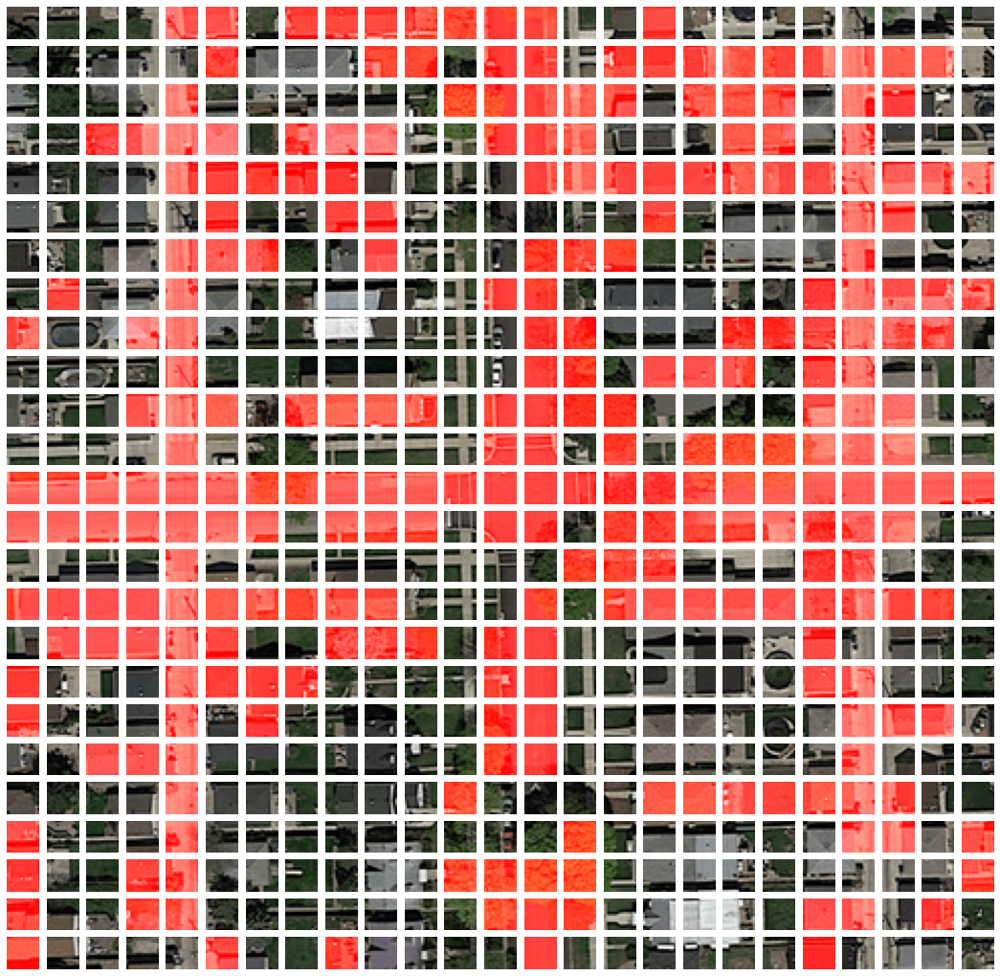

In [7]:
show_patched_image(train_patches[:25*25], clf.predict(x_train[:25*25]))

Finally, let us compute predictions on test images. The code in this cell is adapted from `mask_to_submission.py`.

In [8]:
def create_submission(labels, test_filenames, submission_filename):
    test_path='test_images/test_images'
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn, patch_array in zip(sorted(test_filenames), test_pred):
            img_number = int(re.search(r"\d+", fn).group(0))
            for i in range(patch_array.shape[0]):
                for j in range(patch_array.shape[1]):
                    f.write("{:03d}_{}_{},{}\n".format(img_number, j*PATCH_SIZE, i*PATCH_SIZE, int(patch_array[i, j])))

test_path = 'test_images/test_images'
test_filenames = sorted(glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
test_patches = image_to_patches(test_images)
x_test = extract_features(test_patches)
test_pred = clf.predict(x_test).reshape(-1, test_images.shape[1] // PATCH_SIZE, test_images.shape[2] // PATCH_SIZE)
create_submission(test_pred, test_filenames, submission_filename='logreg_submission.csv')

By submitting this .csv to Kaggle, we should get a public score of around 0.50.

This method is producing many false positives and has **obvious drawbacks**. Spacial patterns in the image are completely ignored and occlusion cannot be dealt with. Moreover, the method required us to manually define interesting features. While crafting better features can surely improve the performance of our classifier, our method would require to be redesigned from scratch to deal with other segmentation tasks. We will then turn to methods that overcome these limitations.

# Method 2 - Convolutional Neural Networks

The early successes \[4, 5\] of CNNs transformed the field of computer vision.
Convolutional neural networks build upon the assumption that inputs are representing images. This opens up the possibility to exploit certain spatial and structural properties: neurons can be arranged in a 2D grid and connections can be localized and share weights. A comprehensive introduction to CNNs is beyond the current scope and can be found in lectures and tutorials.

For the purpose of this notebook, it is sufficient to remark that CNNs are capable of **automatically extracting useful features** from images and can approximate very complex functions. This alone will bring a great improvement over the previous approach.

We will first introduce some utility functions for loading and visualizing data.

\\

\[4\] Krizhevsky, Alex et al. "ImageNet Classification with Deep Convolutional Neural Networks", [NeurIPS2012](https://papers.nips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf)

\[5\] Simoyan, Karen et al. "Very Deep Convolutional Networks for Large-Scale Image Recognition", [arXiv:1409.1556](https://arxiv.org/abs/1409.1556)


In [9]:
import torch
from torch import nn
from torch.utils.tensorboard import SummaryWriter
from tqdm.notebook import tqdm

def np_to_tensor(x, device):
    # allocates tensors from np.arrays
    if device == 'cpu':
        return torch.from_numpy(x).cpu()
    else:
        return torch.from_numpy(x).contiguous().pin_memory().to(device=device, non_blocking=True)


class ImageDataset(torch.utils.data.Dataset):
    # dataset class that deals with loading the data and making it available by index.

    def __init__(self, path, device, use_patches=True, resize_to=(400, 400)):
        self.path = path
        self.device = device
        self.use_patches = use_patches
        self.resize_to=resize_to
        self.x, self.y, self.n_samples = None, None, None
        self._load_data()

    def _load_data(self):  # not very scalable, but good enough for now
        self.x = load_all_from_path(os.path.join(self.path, 'images'))
        self.y = load_all_from_path(os.path.join(self.path, 'groundtruth'))
        if self.use_patches:  # split each image into patches
            self.x, self.y = image_to_patches(self.x, self.y)
        elif self.resize_to != (self.x.shape[1], self.x.shape[2]):  # resize images
            self.x = np.stack([cv2.resize(img, dsize=self.resize_to) for img in self.x], 0)
            self.y = np.stack([cv2.resize(mask, dsize=self.resize_to) for mask in self.y], 0)
        self.x = np.moveaxis(self.x, -1, 1)  # pytorch works with CHW format instead of HWC
        self.n_samples = len(self.x)

    def _preprocess(self, x, y):
        # to keep things simple we will not apply transformations to each sample,
        # but it would be a very good idea to look into preprocessing
        return x, y

    def __getitem__(self, item):
        return self._preprocess(np_to_tensor(self.x[item], self.device), np_to_tensor(self.y[[item]], self.device))
    
    def __len__(self):
        return self.n_samples


def show_val_samples(x, y, y_hat, segmentation=False):
    # training callback to show predictions on validation set
    imgs_to_draw = min(5, len(x))
    if x.shape[-2:] == y.shape[-2:]:  # segmentation
        fig, axs = plt.subplots(3, imgs_to_draw, figsize=(18.5, 12))
        for i in range(imgs_to_draw):
            axs[0, i].imshow(np.moveaxis(x[i], 0, -1))
            axs[1, i].imshow(np.concatenate([np.moveaxis(y_hat[i], 0, -1)] * 3, -1))
            axs[2, i].imshow(np.concatenate([np.moveaxis(y[i], 0, -1)]*3, -1))
            axs[0, i].set_title(f'Sample {i}')
            axs[1, i].set_title(f'Predicted {i}')
            axs[2, i].set_title(f'True {i}')
            axs[0, i].set_axis_off()
            axs[1, i].set_axis_off()
            axs[2, i].set_axis_off()
    else:  # classification
        fig, axs = plt.subplots(1, imgs_to_draw, figsize=(18.5, 6))
        for i in range(imgs_to_draw):
            axs[i].imshow(np.moveaxis(x[i], 0, -1))
            axs[i].set_title(f'True: {np.round(y[i]).item()}; Predicted: {np.round(y_hat[i]).item()}')
            axs[i].set_axis_off()
    plt.show()

Here we define a general training loop.

In [10]:
def train(train_dataloader, eval_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs):
    # training loop
    logdir = './tensorboard/net'
    writer = SummaryWriter(logdir)  # tensorboard writer (can also log images)

    history = {}  # collects metrics at the end of each epoch

    for epoch in range(n_epochs):  # loop over the dataset multiple times

        # initialize metric list
        metrics = {'loss': [], 'val_loss': []}
        for k, _ in metric_fns.items():
            metrics[k] = []
            metrics['val_'+k] = []

        pbar = tqdm(train_dataloader, desc=f'Epoch {epoch+1}/{n_epochs}')
        # training
        model.train()
        for (x, y) in pbar:
            optimizer.zero_grad()  # zero out gradients
            y_hat = model(x)  # forward pass
            loss = loss_fn(y_hat, y)
            loss.backward()  # backward pass
            optimizer.step()  # optimize weights

            # log partial metrics
            metrics['loss'].append(loss.item())
            for k, fn in metric_fns.items():
                metrics[k].append(fn(y_hat, y).item())
            pbar.set_postfix({k: sum(v)/len(v) for k, v in metrics.items() if len(v) > 0})

        # validation
        model.eval()
        with torch.no_grad():  # do not keep track of gradients
            for (x, y) in eval_dataloader:
                y_hat = model(x)  # forward pass
                loss = loss_fn(y_hat, y)
                
                # log partial metrics
                metrics['val_loss'].append(loss.item())
                for k, fn in metric_fns.items():
                    metrics['val_'+k].append(fn(y_hat, y).item())

        # summarize metrics, log to tensorboard and display
        history[epoch] = {k: sum(v) / len(v) for k, v in metrics.items()}
        for k, v in history[epoch].items():
          writer.add_scalar(k, v, epoch)
        print(' '.join(['\t- '+str(k)+' = '+str(v)+'\n ' for (k, v) in history[epoch].items()]))
        show_val_samples(x.detach().cpu().numpy(), y.detach().cpu().numpy(), y_hat.detach().cpu().numpy())

    print('Finished Training')
    # plot loss curves
    plt.plot([v['loss'] for k, v in history.items()], label='Training Loss')
    plt.plot([v['val_loss'] for k, v in history.items()], label='Validation Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()

In [11]:
# The training loop also logs metrics to tensorboard. They can be visualized in real time by uncommenting the next two lines:

# %load_ext tensorboard
# %tensorboard --logdir ./tensorboard

# Tensorboard can also be used to log images, which can be great for visually inspecting your output.

We will first try a straightforward approach and simply replace the hand-designed feature extractor and the classifier with a **neural network** that is trainable end-to-end.

We implement a very simple design: 16x16 patches will are fed into a small CNN with 3 convolutional layers follower by 2 linear layers. The network relies on Max Pooling to grow the receptive field and on Batch Normalization \[6\] and Dropout \[7\] to stabilize the training. The final linear layer outputs a scalar through a sigmoid activation. The output is used to compute a binary cross-entropy loss that is then backpropagated to train the weights of the network. A graphical representation of the network follows.

It is very advisable that the notebook has access to a GPU to accelerate the training procedure. You can enable a GPU backend by clicking on Runtime -> Change runtime type -> GPU. You can check the hardware you are assigned with

```
!nvidia-smi
```

This notebook was tested with a Tesla T4, but might run into Out Of Memory errors with less powerful graphic cards. In this case, lowering the batch size may help.

\[6\] Ioffe, Sergey at al. "Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift", [arXiv:1502.03167](https://arxiv.org/abs/1502.03167)

\[7\] Srivastava, Nitish et al. "Dropout: A Simple Way to Prevent Neural Networks from Overfitting", [JMLR 2014](https://jmlr.org/papers/v15/srivastava14a.html)

![]( 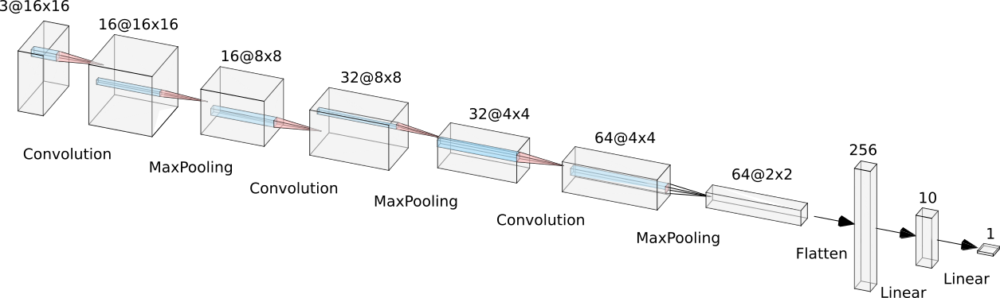)

In [12]:
class PatchCNN(nn.Module):
    # simple CNN for classification of patches
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1),
                                 nn.ReLU(),
                                 nn.MaxPool2d(2, 2),
                                 nn.BatchNorm2d(16),
                                 nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1),
                                 nn.ReLU(),
                                 nn.MaxPool2d(2, 2),
                                 nn.BatchNorm2d(32),
                                 nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
                                 nn.ReLU(),
                                 nn.MaxPool2d(2, 2),
                                 nn.BatchNorm2d(64),
                                 nn.Dropout(0.5),
                                 nn.Flatten(),
                                 nn.Linear(256, 10),
                                 nn.ReLU(),
                                 nn.Dropout(0.5),
                                 nn.Linear(10, 1),
                                 nn.Sigmoid())

    def forward(self, x):
        return self.net(x)

def accuracy_fn(y_hat, y):
    # computes classification accuracy
    return (y_hat.round() == y.round()).float().mean()


	- loss = 0.5314618057148023
  	- val_loss = 0.4781413151293385
  	- acc = 0.7213900861414996
  	- val_acc = 0.7556375143479328
 


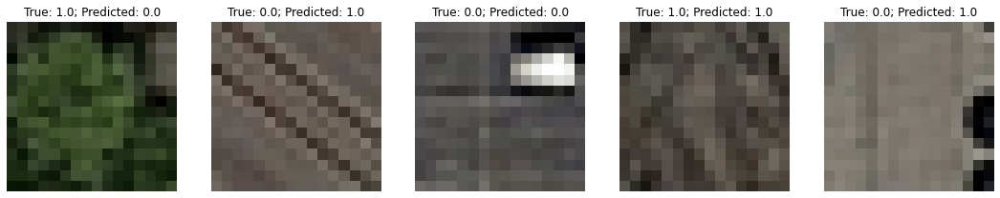


	- loss = 0.4458309181034565
  	- val_loss = 0.528361594190403
  	- acc = 0.8041285021738572
  	- val_acc = 0.7235090975858727
 


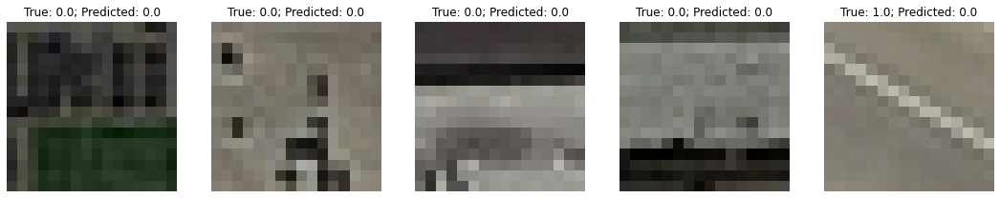


	- loss = 0.42319341179999437
  	- val_loss = 0.45573555632513396
  	- acc = 0.8119373284957626
  	- val_acc = 0.7247394834245954
 


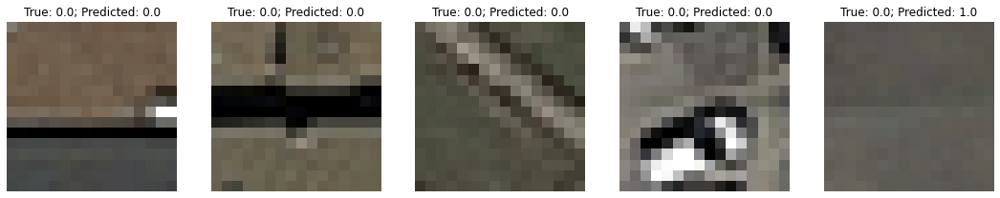


	- loss = 0.40595740269530906
  	- val_loss = 0.49355061990874155
  	- acc = 0.8154707091775808
  	- val_acc = 0.745126588003976
 


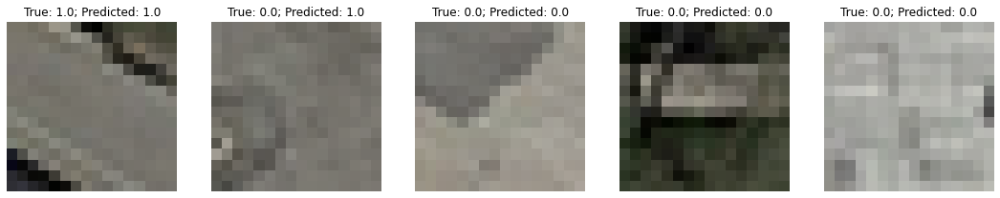


	- loss = 0.39732228605584663
  	- val_loss = 0.4804128870672109
  	- acc = 0.8219980651682074
  	- val_acc = 0.7279673668803001
 


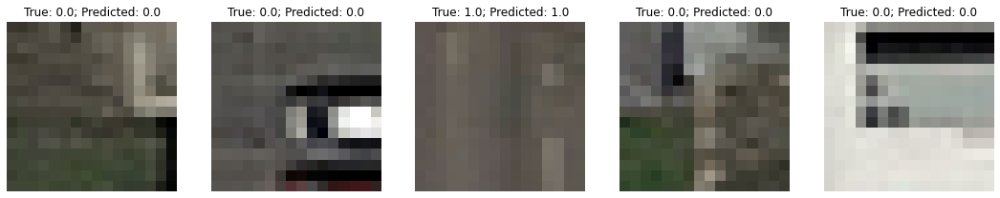


	- loss = 0.38913626088337466
  	- val_loss = 0.5201890571993224
  	- acc = 0.821884796294299
  	- val_acc = 0.723497064746156
 


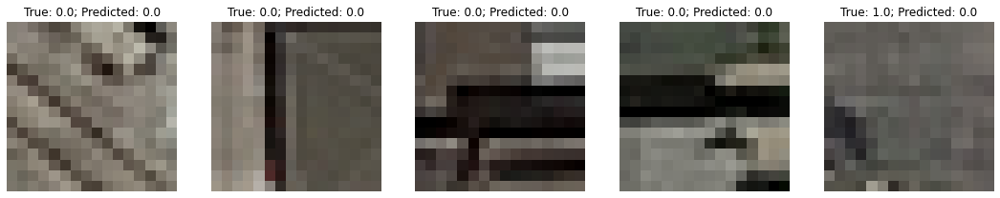


	- loss = 0.3813793906434016
  	- val_loss = 0.410886144151493
  	- acc = 0.8274459982460195
  	- val_acc = 0.7898627020874802
 


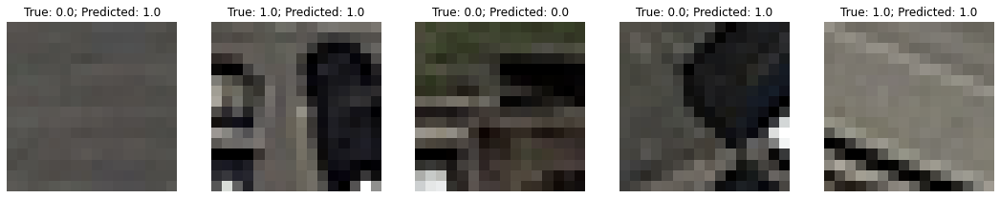


	- loss = 0.3751098241995681
  	- val_loss = 0.5475208734979435
  	- acc = 0.8261706503954801
  	- val_acc = 0.725795389438162
 


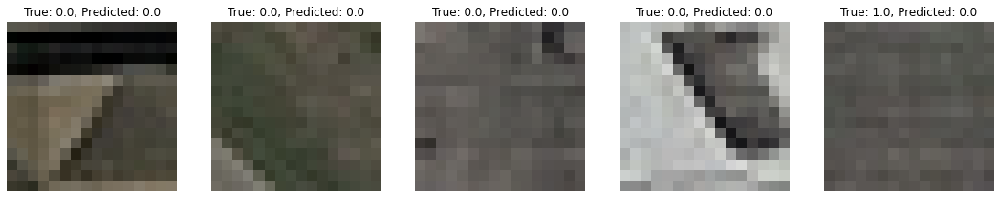


	- loss = 0.3690976882522756
  	- val_loss = 0.43306723906069383
  	- acc = 0.8319945140318437
  	- val_acc = 0.7948323792340805
 


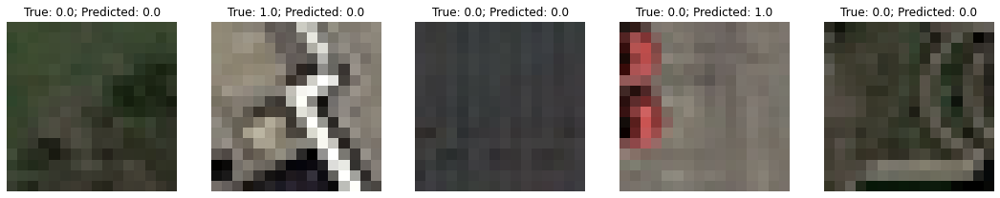


	- loss = 0.36397194124080917
  	- val_loss = 0.4224387182264912
  	- acc = 0.8345623531124808
  	- val_acc = 0.8003585873817911
 


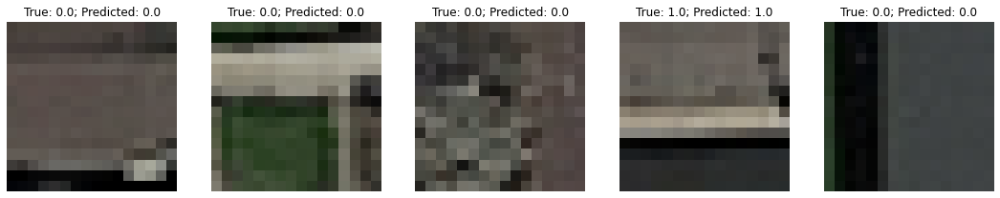


	- loss = 0.3600113072517243
  	- val_loss = 0.44125047995119676
  	- acc = 0.8360813822258603
  	- val_acc = 0.8020191569717563
 


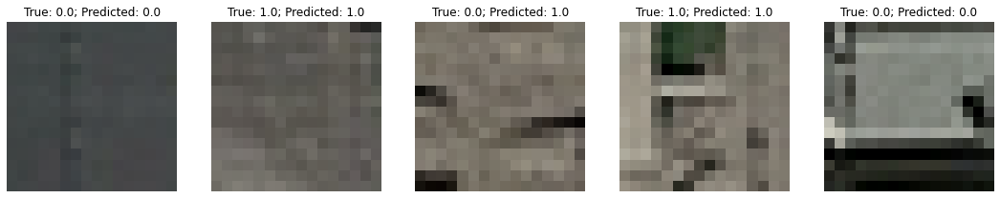


	- loss = 0.3565410105003552
  	- val_loss = 0.5979597306981379
  	- acc = 0.8386320777914741
  	- val_acc = 0.699388718118473
 


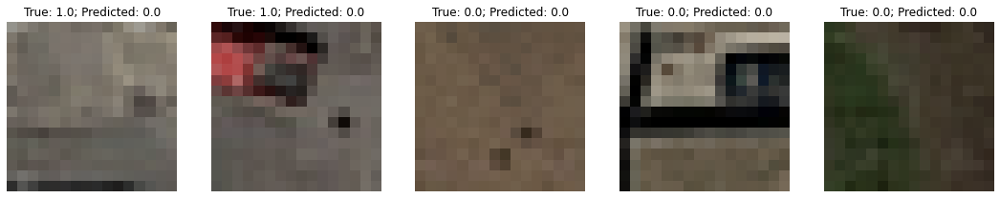


	- loss = 0.3520930131389336
  	- val_loss = 0.42060848523159416
  	- acc = 0.8419591252099384
  	- val_acc = 0.8040316956383842
 


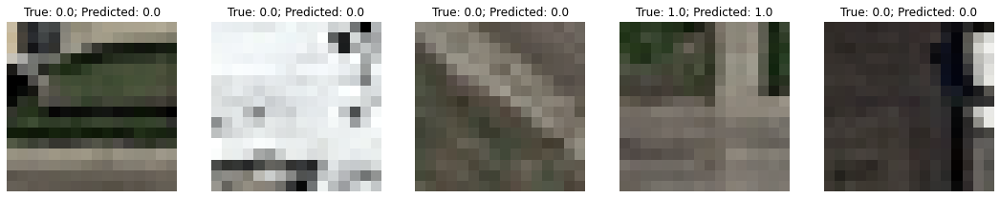


	- loss = 0.34845988486300816
  	- val_loss = 0.4168976271639065
  	- acc = 0.843251616304571
  	- val_acc = 0.7995283019785978
 


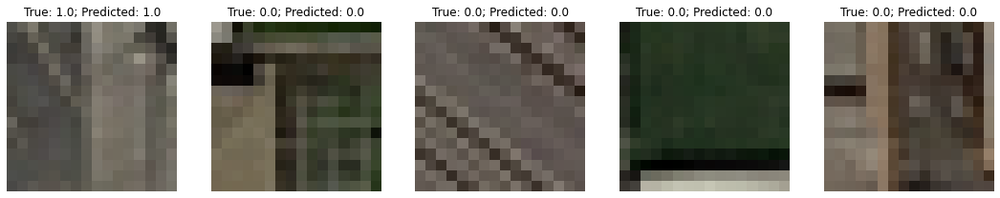


	- loss = 0.34255699952217666
  	- val_loss = 0.48174458559678524
  	- acc = 0.8453682161190293
  	- val_acc = 0.7421844917900708
 


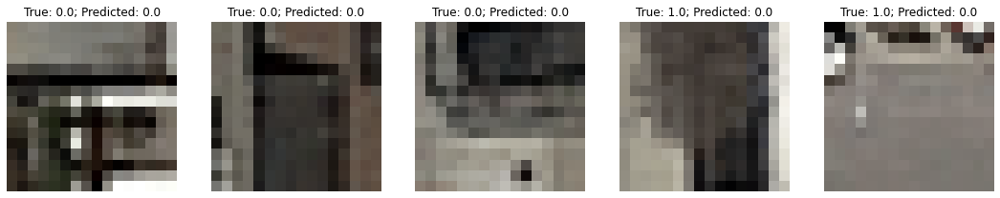


	- loss = 0.3411919655786319
  	- val_loss = 0.4313127629610957
  	- acc = 0.8474805299531329
  	- val_acc = 0.7745896711641428
 


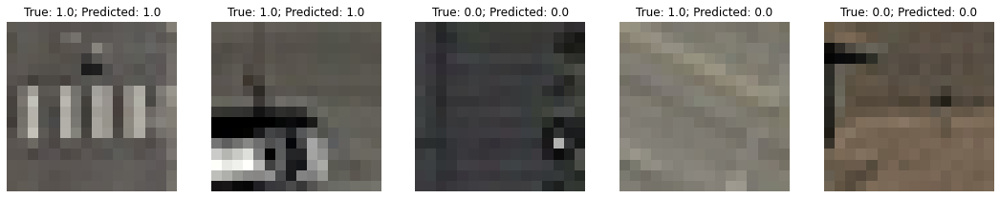


	- loss = 0.3384411990303885
  	- val_loss = 0.44702844108854023
  	- acc = 0.8478007445281203
  	- val_acc = 0.7688167837201333
 


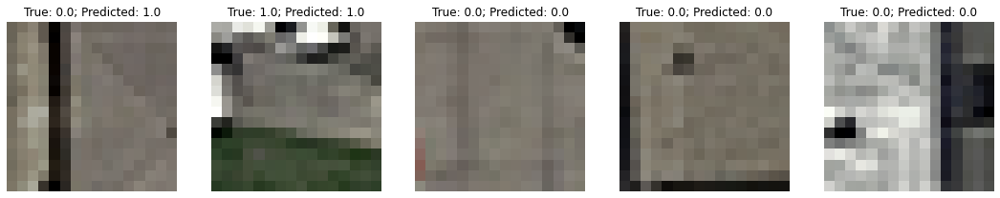


	- loss = 0.3349748986011202
  	- val_loss = 0.41840908296254214
  	- acc = 0.8505320581522855
  	- val_acc = 0.7845741486062809
 


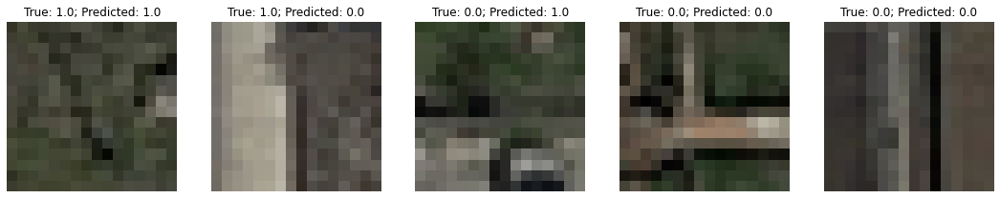


	- loss = 0.33147854391824116
  	- val_loss = 0.46029909776181593
  	- acc = 0.852744171294299
  	- val_acc = 0.7583539899514646
 


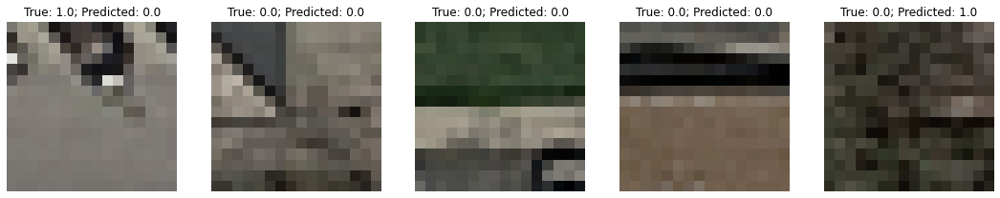


	- loss = 0.3307120402428237
  	- val_loss = 0.44794599559842324
  	- acc = 0.8529964243823832
  	- val_acc = 0.7669095348338691
 


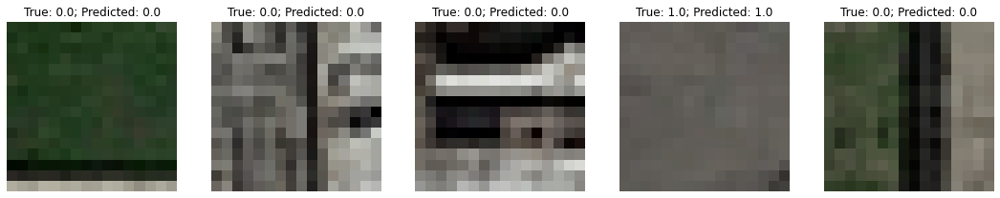

Finished Training


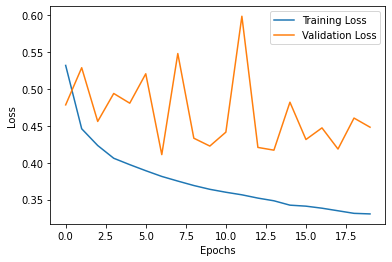

In [13]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'  # automatically select device
train_dataset = ImageDataset('training', device)
val_dataset = ImageDataset('validation', device)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=128, shuffle=True)
model = PatchCNN().to(device)
loss_fn = nn.BCELoss()
metric_fns = {'acc': accuracy_fn}
optimizer = torch.optim.Adam(model.parameters())
n_epochs = 20
train(train_dataloader, val_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs)

In [14]:
# predict on test set
test_filenames = sorted(glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
test_patches = np.moveaxis(image_to_patches(test_images), -1, 1)  # HWC to CHW
test_patches = np.reshape(test_patches, (38, -1, 3, PATCH_SIZE, PATCH_SIZE))  # split in batches for memory constraints
test_pred = [model(np_to_tensor(batch, device)).detach().cpu().numpy() for batch in test_patches]
test_pred = np.concatenate(test_pred, 0)
test_pred = np.round(test_pred.reshape(test_images.shape[0], test_images.shape[1] // PATCH_SIZE, test_images.shape[1] // PATCH_SIZE))
create_submission(test_pred, test_filenames, submission_filename='cnn_submission.csv')

This classifier is able to reach much better accuracy (public score around 0.80 on Kaggle), which can be further improved by tuning the architecture and hyperparameters. However, some information is lost during the data loading process. Namely, there is no way for the network to recover global features in the images. A patch might in fact be easier to classify considering the neighboring areas. Following this intuition, we will introduce our last method.

# Method 3 - U-Net

Instead of dealing with indipendent classification problems, our final method reframes the task as an **high resolution segmentation problem**. Our model will receive a large image covering multiple patches and output a single channel greyscale image at the same resolution. We will then use our brightness-based heuristic to transform the output into labels.

We will adopt a slightly modified U-Net \[8\]. It belongs to a family of **fully convolutional neural networks**, which owe their name to the absence of fully connected layers in the architecture. Moreover, UNet adopts an encoder-decoder architecture: the first blocks abstract high level semantics from the input and the remaining blocks refine a segmentation mask. Skip connections (marked in grey in the picture) help propagate gradients and carry low-level features further down the line. A key advantage of this method over the previous ones is that it can leverage global information.

Note: our implementation differs from the original by introducing Batch Normalization layers and padded convolutions to avoid cropping features.

\\

\[8\] Ronneberger, Olaf et al. "U-Net: Convolutional Networks for Biomedical Image Segmentation", [arxiv:1505.04597](https://arxiv.org/abs/1505.04597)


![]( 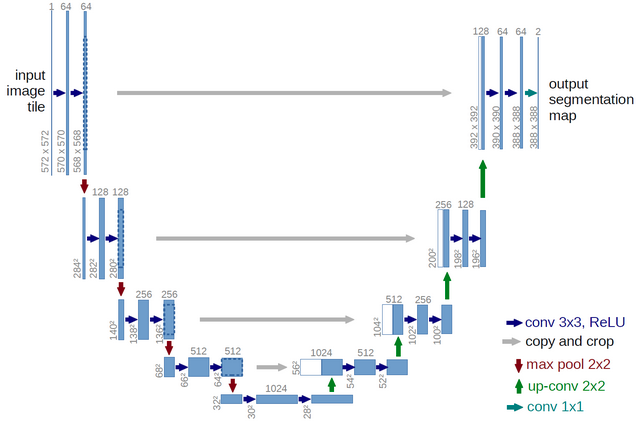)

In [15]:
class Block(nn.Module):
    # a repeating structure composed of two convolutional layers with batch normalization and ReLU activations
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels=in_ch, out_channels=out_ch, kernel_size=3, padding=1),
                                   nn.ReLU(),
                                   nn.BatchNorm2d(out_ch),
                                   nn.Conv2d(in_channels=out_ch, out_channels=out_ch, kernel_size=3, padding=1),
                                   nn.ReLU())

    def forward(self, x):
        return self.block(x)

        
class UNet(nn.Module):
    # UNet-like architecture for single class semantic segmentation.
    def __init__(self, chs=(3,64,128,256,512,1024)):
        super().__init__()
        enc_chs = chs  # number of channels in the encoder
        dec_chs = chs[::-1][:-1]  # number of channels in the decoder
        self.enc_blocks = nn.ModuleList([Block(in_ch, out_ch) for in_ch, out_ch in zip(enc_chs[:-1], enc_chs[1:])])  # encoder blocks
        self.pool = nn.MaxPool2d(2)  # pooling layer (can be reused as it will not be trained)
        self.upconvs = nn.ModuleList([nn.ConvTranspose2d(in_ch, out_ch, 2, 2) for in_ch, out_ch in zip(dec_chs[:-1], dec_chs[1:])])  # deconvolution
        self.dec_blocks = nn.ModuleList([Block(in_ch, out_ch) for in_ch, out_ch in zip(dec_chs[:-1], dec_chs[1:])])  # decoder blocks
        self.head = nn.Sequential(nn.Conv2d(dec_chs[-1], 1, 1), nn.Sigmoid()) # 1x1 convolution for producing the output

    def forward(self, x):
        # encode
        enc_features = []
        for block in self.enc_blocks[:-1]:
            x = block(x)  # pass through the block
            enc_features.append(x)  # save features for skip connections
            x = self.pool(x)  # decrease resolution
        x = self.enc_blocks[-1](x)
        # decode
        for block, upconv, feature in zip(self.dec_blocks, self.upconvs, enc_features[::-1]):
            x = upconv(x)  # increase resolution
            x = torch.cat([x, feature], dim=1)  # concatenate skip features
            x = block(x)  # pass through the block
        return self.head(x)  # reduce to 1 channel


def patch_accuracy_fn(y_hat, y):
    # computes accuracy weighted by patches (metric used on Kaggle for evaluation)
    h_patches = y.shape[-2] // PATCH_SIZE
    w_patches = y.shape[-1] // PATCH_SIZE
    patches_hat = y_hat.reshape(-1, 1, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE).mean((-1, -3)) > CUTOFF
    patches = y.reshape(-1, 1, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE).mean((-1, -3)) > CUTOFF
    return (patches == patches_hat).float().mean()


	- loss = 0.49556251366933185
  	- val_loss = 24.228788375854492
  	- acc = 0.7531894544760386
  	- val_acc = 0.7290056049823761
  	- patch_acc = 0.5320276319980621
  	- val_patch_acc = 0.6804470717906952
 


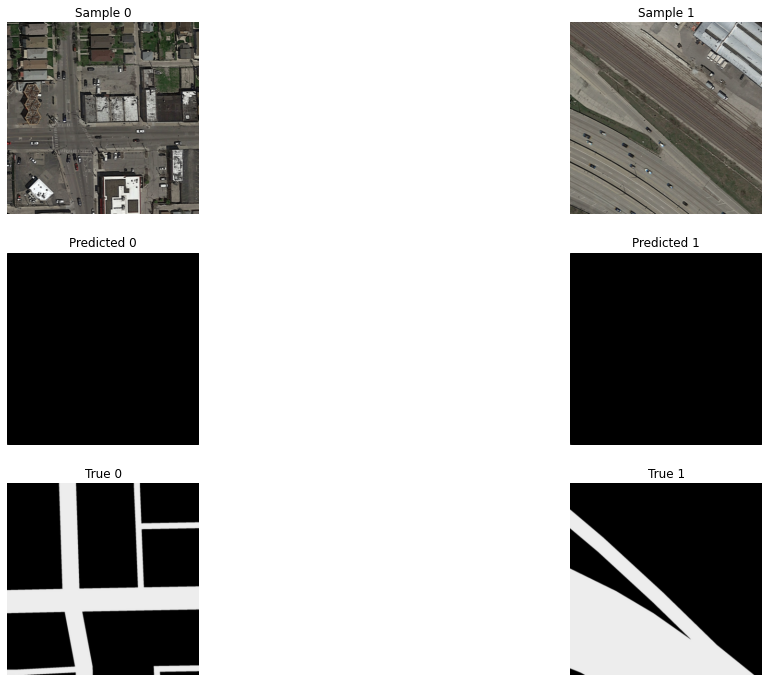


	- loss = 0.40382087230682373
  	- val_loss = 0.7559599578380585
  	- acc = 0.8117830554644266
  	- val_acc = 0.3811556547880173
  	- patch_acc = 0.7554434339205424
  	- val_patch_acc = 0.3861762136220932
 


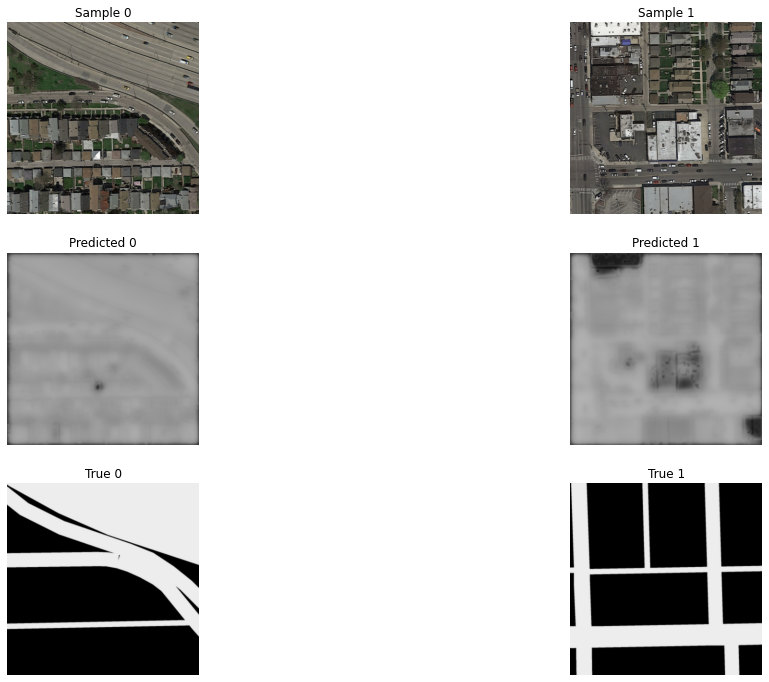


	- loss = 0.33107837786277133
  	- val_loss = 0.6015894114971161
  	- acc = 0.8445447335640589
  	- val_acc = 0.6146397292613983
  	- patch_acc = 0.8094437271356583
  	- val_patch_acc = 0.4629991352558136
 


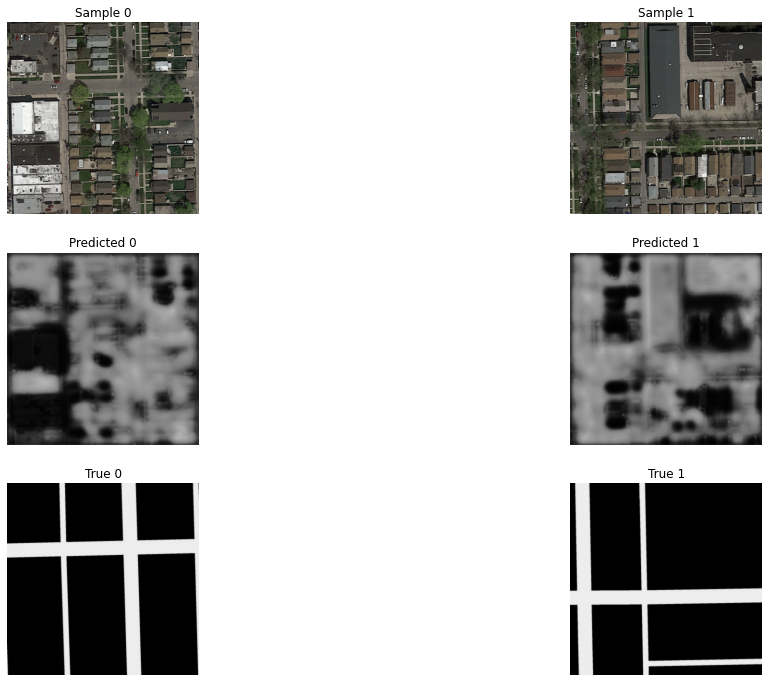


	- loss = 0.31071000297864276
  	- val_loss = 0.41047728061676025
  	- acc = 0.861159086227417
  	- val_acc = 0.7987916767597198
  	- patch_acc = 0.8374204387267431
  	- val_patch_acc = 0.7422960102558136
 


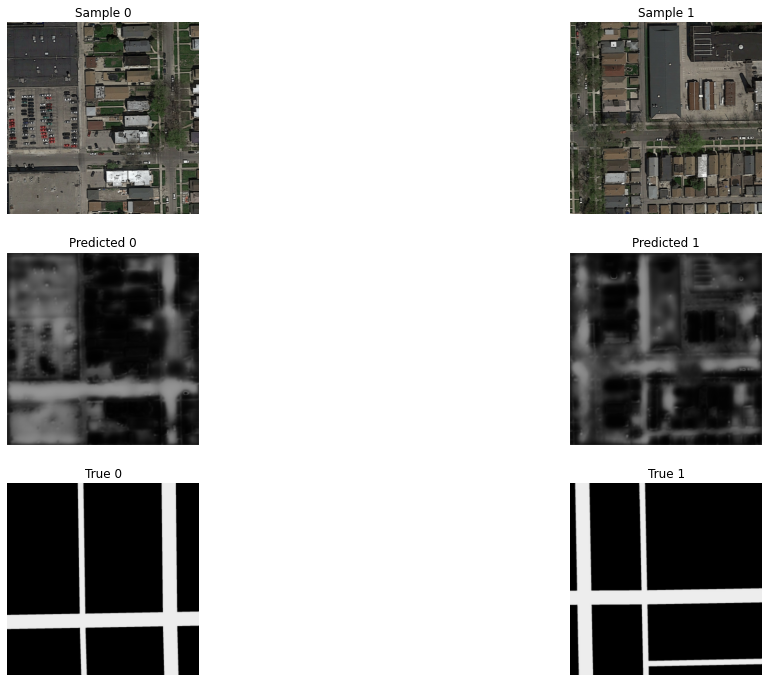


	- loss = 0.2907757783929507
  	- val_loss = 0.6973780989646912
  	- acc = 0.8668117572863897
  	- val_acc = 0.7533153891563416
  	- patch_acc = 0.8432255536317825
  	- val_patch_acc = 0.6922743022441864
 


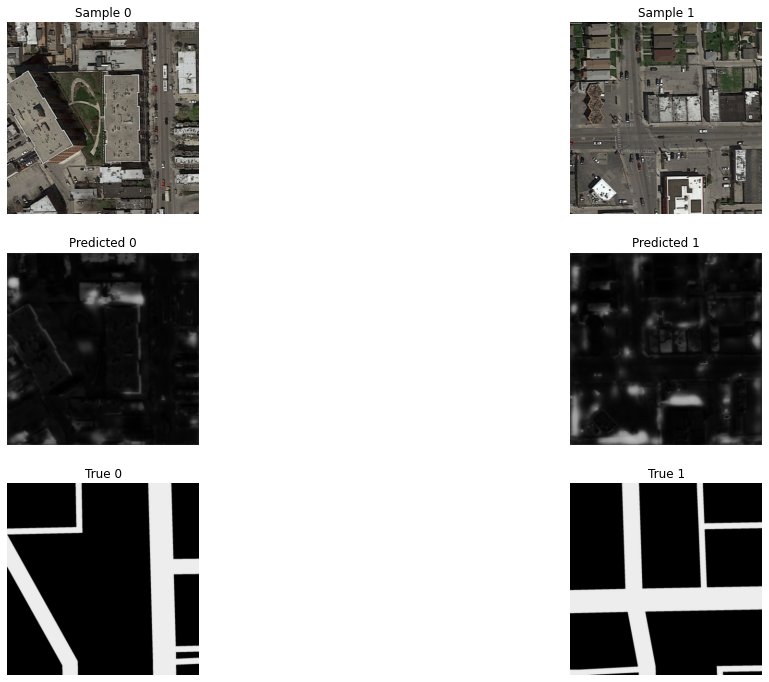


	- loss = 0.28456276034315425
  	- val_loss = 0.44822096824645996
  	- acc = 0.8797540416320165
  	- val_acc = 0.7566888630390167
  	- patch_acc = 0.8485785673062006
  	- val_patch_acc = 0.7528211772441864
 


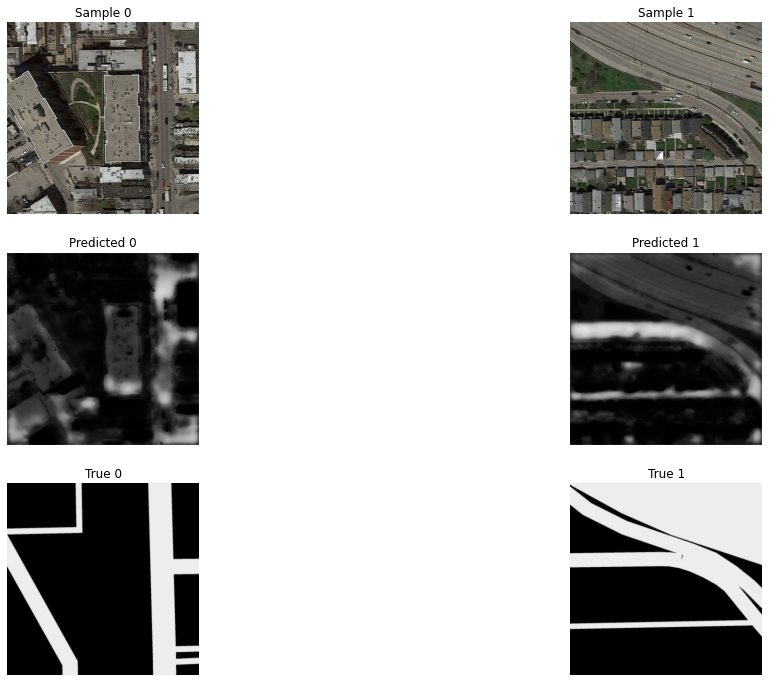


	- loss = 0.26908885315060616
  	- val_loss = 0.39944493770599365
  	- acc = 0.8834500511487325
  	- val_acc = 0.7920667827129364
  	- patch_acc = 0.8651620447635651
  	- val_patch_acc = 0.7834201455116272
 


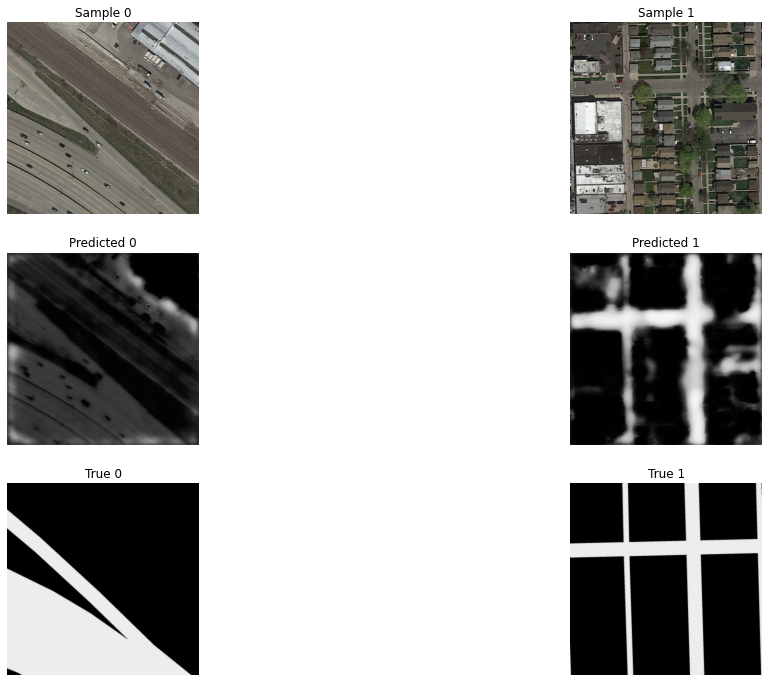


	- loss = 0.2489197589457035
  	- val_loss = 0.39459218084812164
  	- acc = 0.896809125940005
  	- val_acc = 0.7905659079551697
  	- patch_acc = 0.8791594356298447
  	- val_patch_acc = 0.7676866352558136
 


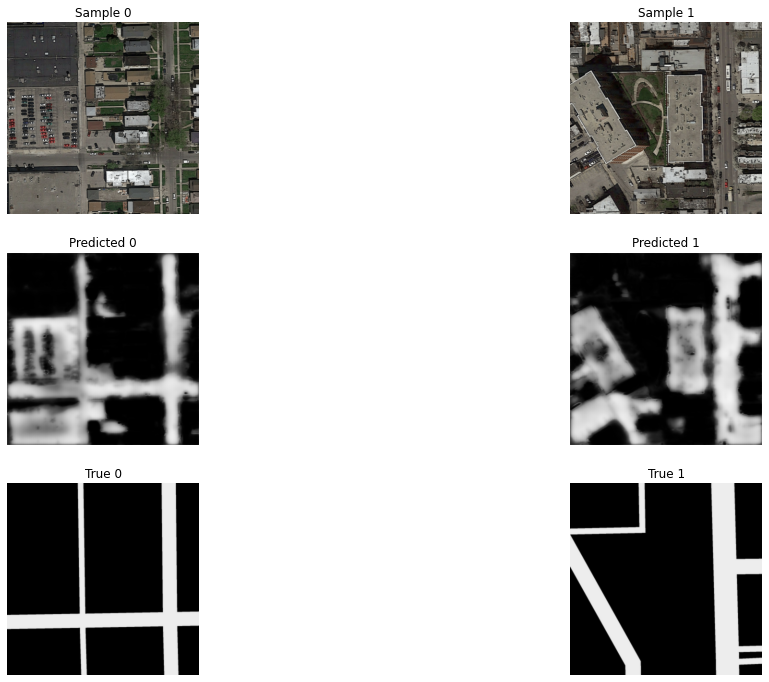


	- loss = 0.23973876237869263
  	- val_loss = 0.3599567860364914
  	- acc = 0.8994742582241694
  	- val_acc = 0.82891845703125
  	- patch_acc = 0.8851092457771301
  	- val_patch_acc = 0.8108724057674408
 


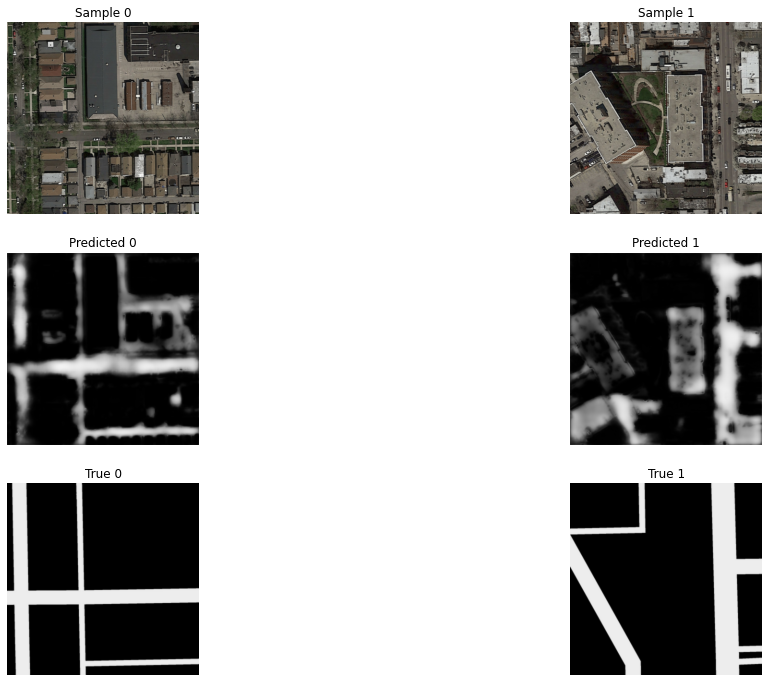


	- loss = 0.22308154652516046
  	- val_loss = 0.39427393674850464
  	- acc = 0.9119668950637182
  	- val_acc = 0.830533355474472
  	- patch_acc = 0.8948567708333334
  	- val_patch_acc = 0.8053385615348816
 


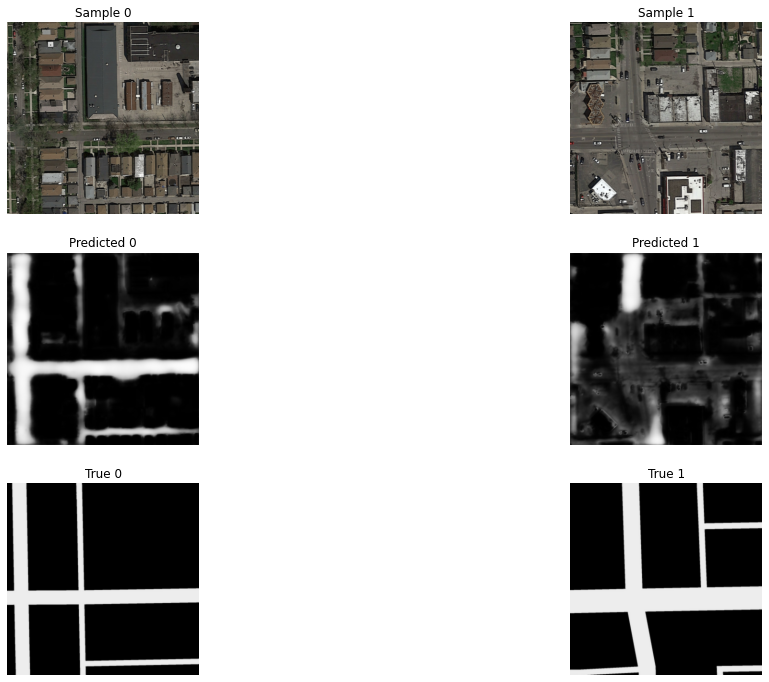


	- loss = 0.2058080161611239
  	- val_loss = 0.2599807232618332
  	- acc = 0.9208633253971735
  	- val_acc = 0.8848410844802856
  	- patch_acc = 0.9108073016007742
  	- val_patch_acc = 0.8654513955116272
 


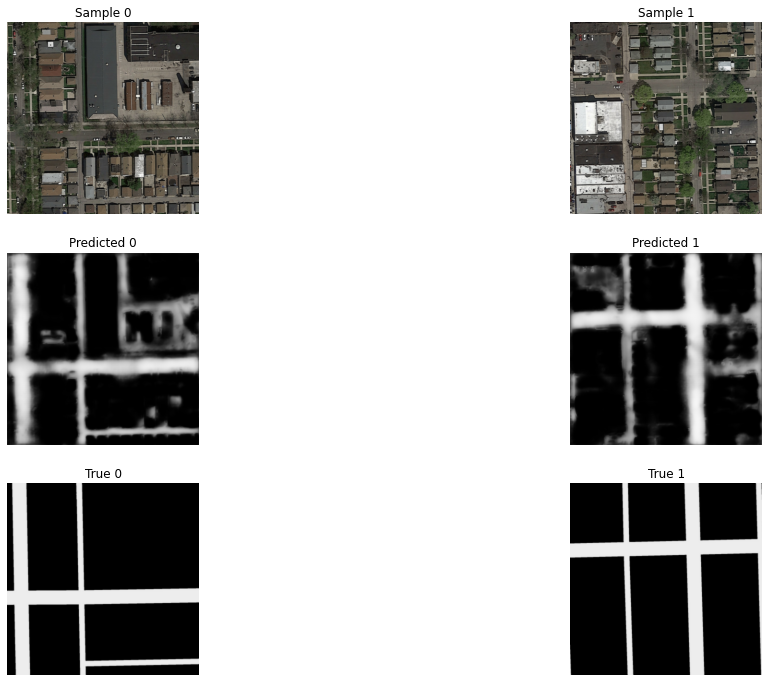


	- loss = 0.2018629883726438
  	- val_loss = 0.3613911420106888
  	- acc = 0.9225654006004333
  	- val_acc = 0.8385281264781952
  	- patch_acc = 0.9068648765484492
  	- val_patch_acc = 0.8409288227558136
 


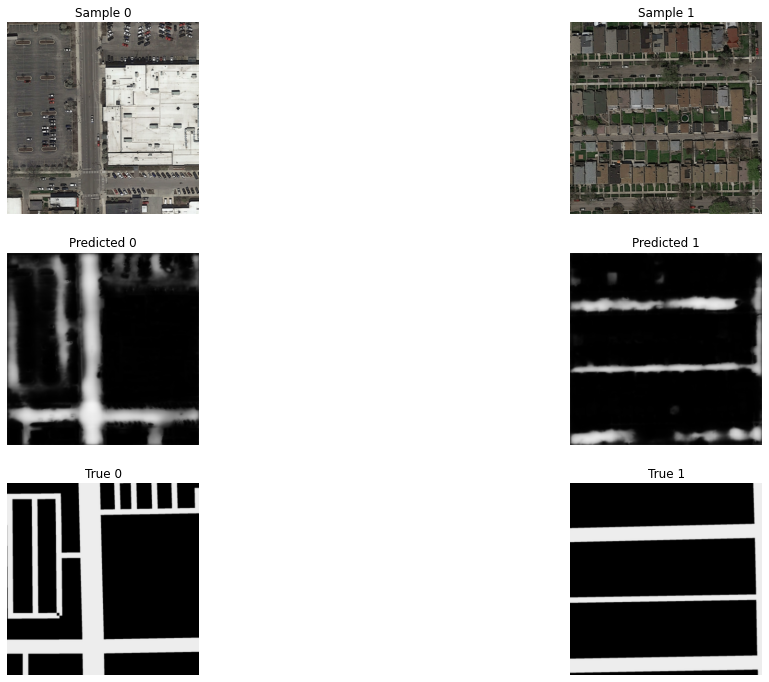


	- loss = 0.20814599841833115
  	- val_loss = 0.49602989852428436
  	- acc = 0.9199490894873937
  	- val_acc = 0.7808482050895691
  	- patch_acc = 0.9065031955639521
  	- val_patch_acc = 0.7506510317325592
 


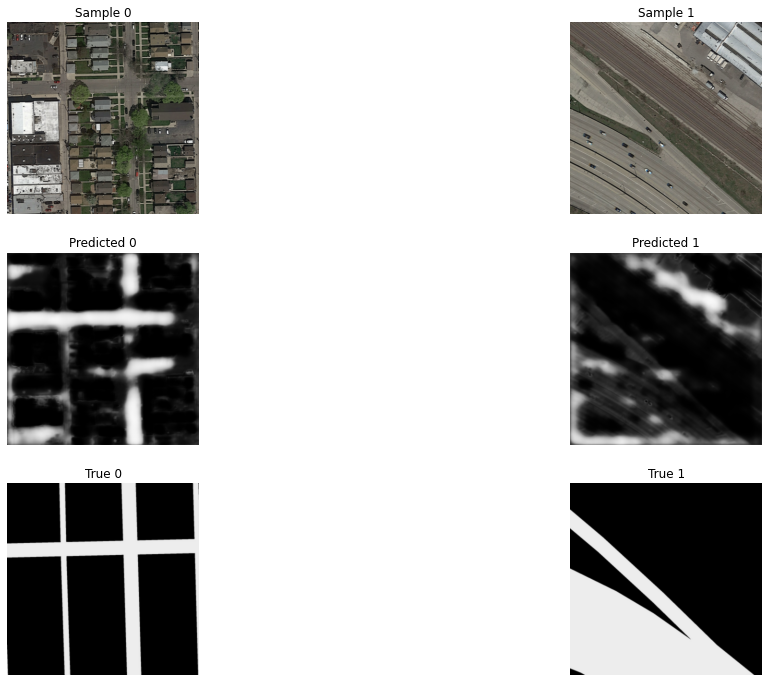


	- loss = 0.21118383730451265
  	- val_loss = 0.3674812316894531
  	- acc = 0.9192196925481161
  	- val_acc = 0.8255361020565033
  	- patch_acc = 0.9097764740387598
  	- val_patch_acc = 0.8123914897441864
 


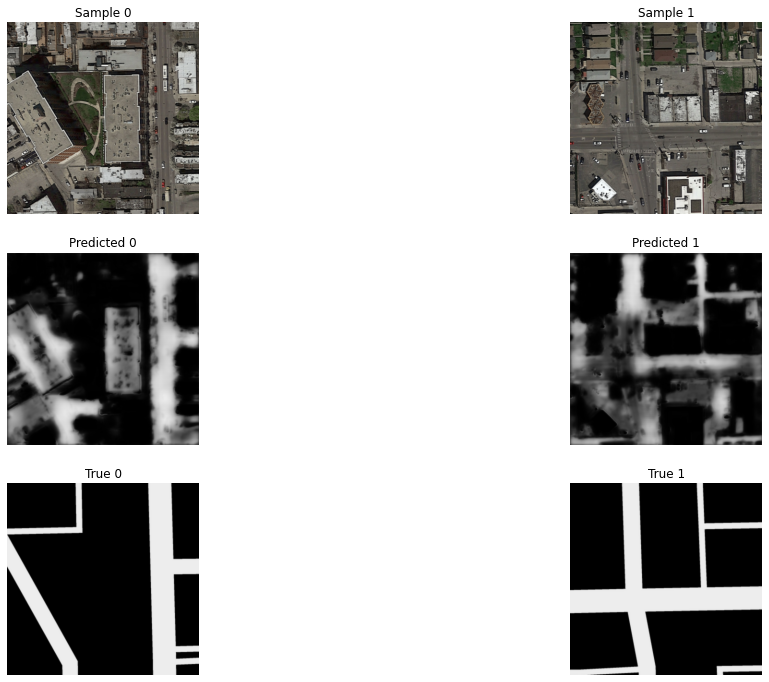


	- loss = 0.21641768390933672
  	- val_loss = 0.3672686368227005
  	- acc = 0.9163877815008163
  	- val_acc = 0.8499374389648438
  	- patch_acc = 0.9022352496782938
  	- val_patch_acc = 0.8359375298023224
 


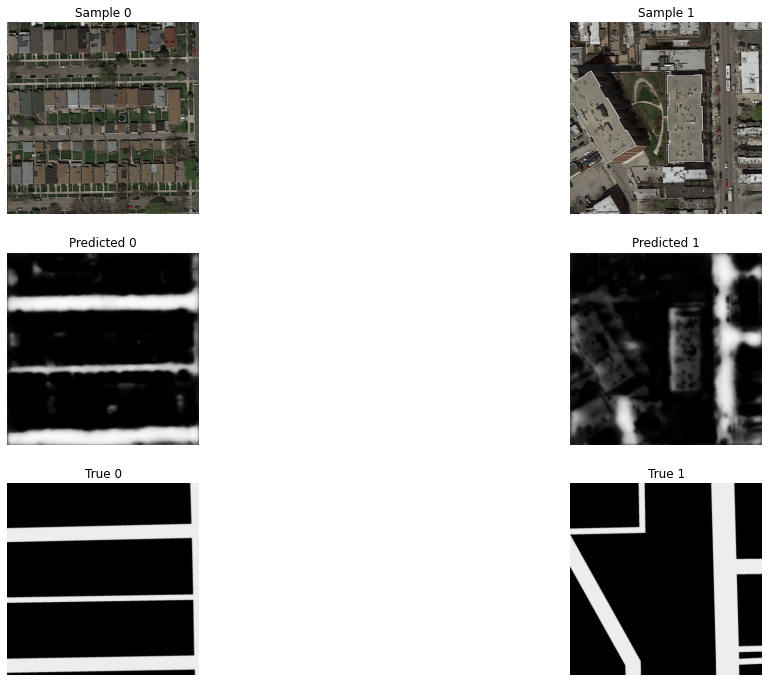


	- loss = 0.1865675449371338
  	- val_loss = 0.3104289174079895
  	- acc = 0.9319344411293665
  	- val_acc = 0.8847931921482086
  	- patch_acc = 0.9240451455116272
  	- val_patch_acc = 0.8797743320465088
 


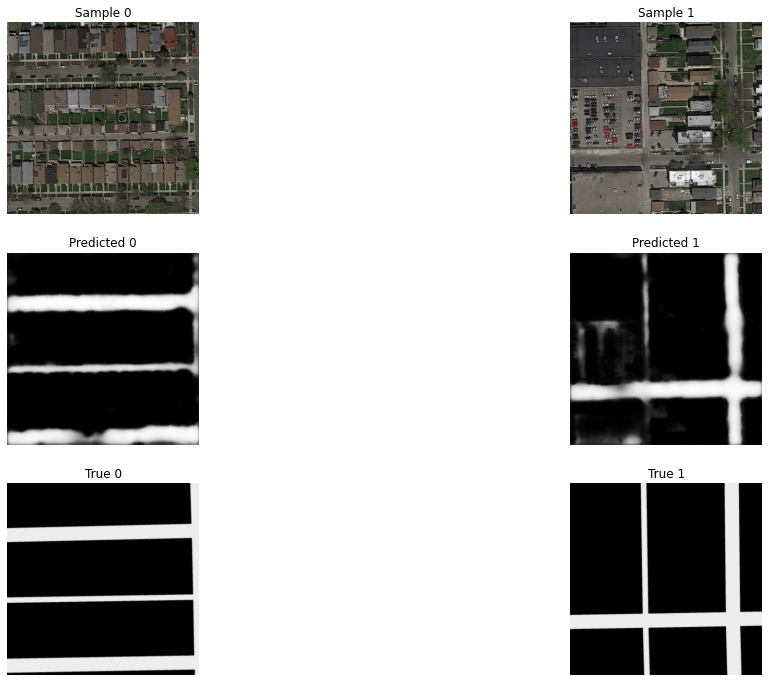


	- loss = 0.18517483149965605
  	- val_loss = 0.4301895946264267
  	- acc = 0.9307037045558294
  	- val_acc = 0.8071543276309967
  	- patch_acc = 0.9260525306065878
  	- val_patch_acc = 0.7885199785232544
 


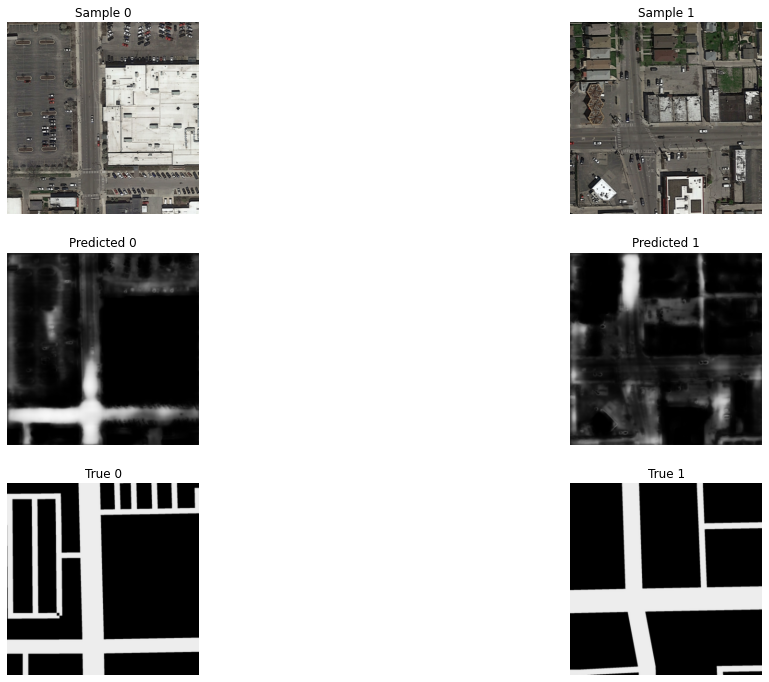


	- loss = 0.17544324696063995
  	- val_loss = 0.7285490185022354
  	- acc = 0.9381820609172186
  	- val_acc = 0.8099721372127533
  	- patch_acc = 0.9300130307674408
  	- val_patch_acc = 0.7923177182674408
 


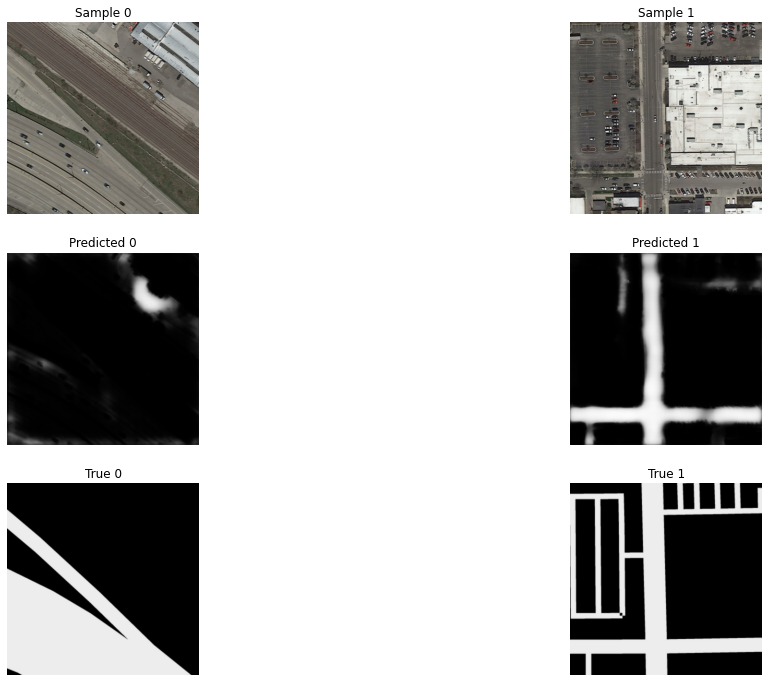


	- loss = 0.15846789131561914
  	- val_loss = 0.5130066722631454
  	- acc = 0.9458274145921072
  	- val_acc = 0.8240797519683838
  	- patch_acc = 0.9448242286841074
  	- val_patch_acc = 0.8097873330116272
 


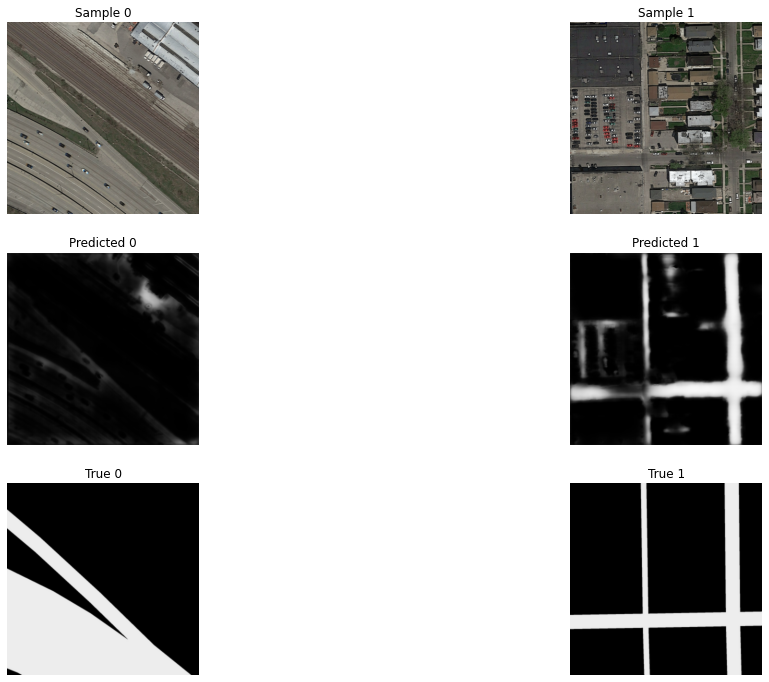


	- loss = 0.15957576408982277
  	- val_loss = 0.37965185940265656
  	- acc = 0.9458673993746439
  	- val_acc = 0.8332456052303314
  	- patch_acc = 0.943142369389534
  	- val_patch_acc = 0.8336588740348816
 


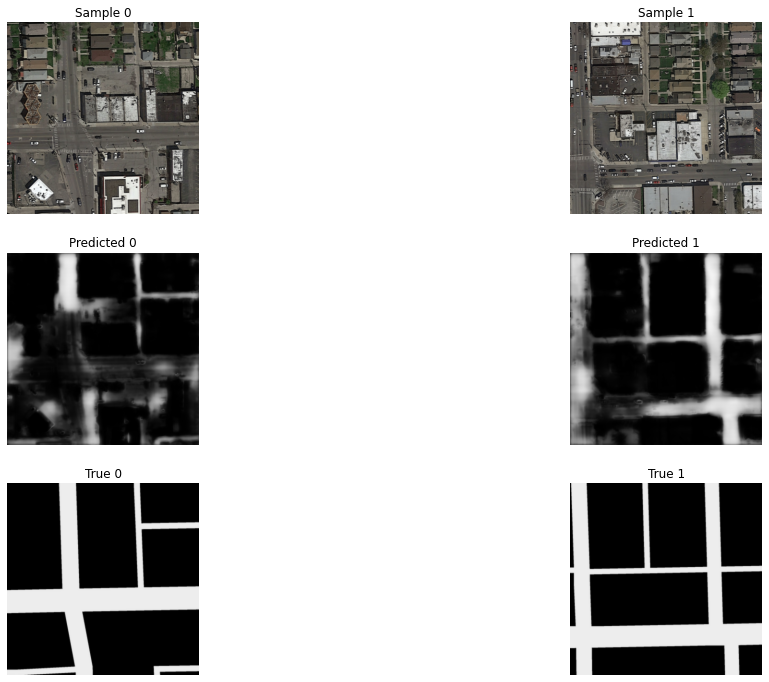


	- loss = 0.15551143077512583
  	- val_loss = 0.41966135799884796
  	- acc = 0.9474988281726837
  	- val_acc = 0.816192626953125
  	- patch_acc = 0.9473018050193787
  	- val_patch_acc = 0.8155381977558136
 


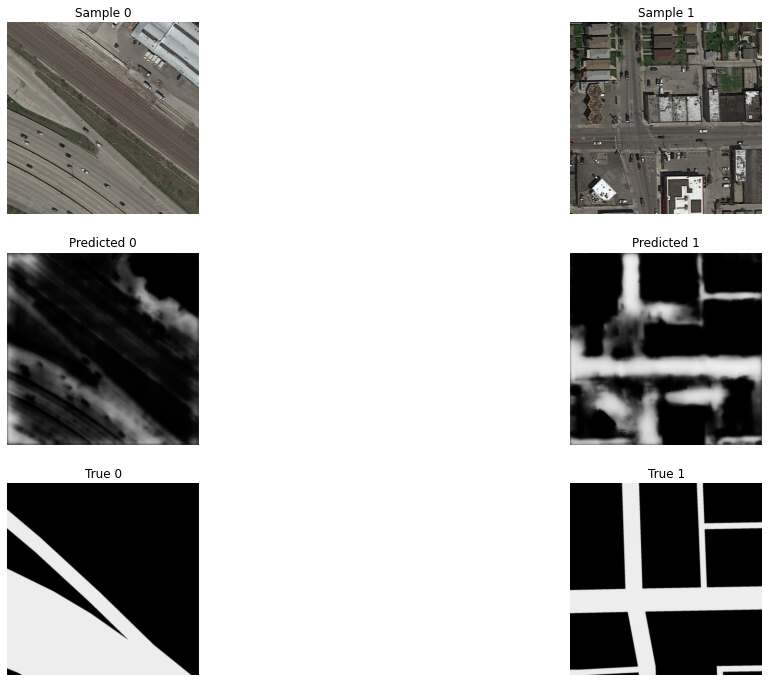


	- loss = 0.15553433385988077
  	- val_loss = 0.30249088257551193
  	- acc = 0.946984256307284
  	- val_acc = 0.8672913610935211
  	- patch_acc = 0.9418583661317825
  	- val_patch_acc = 0.866644948720932
 


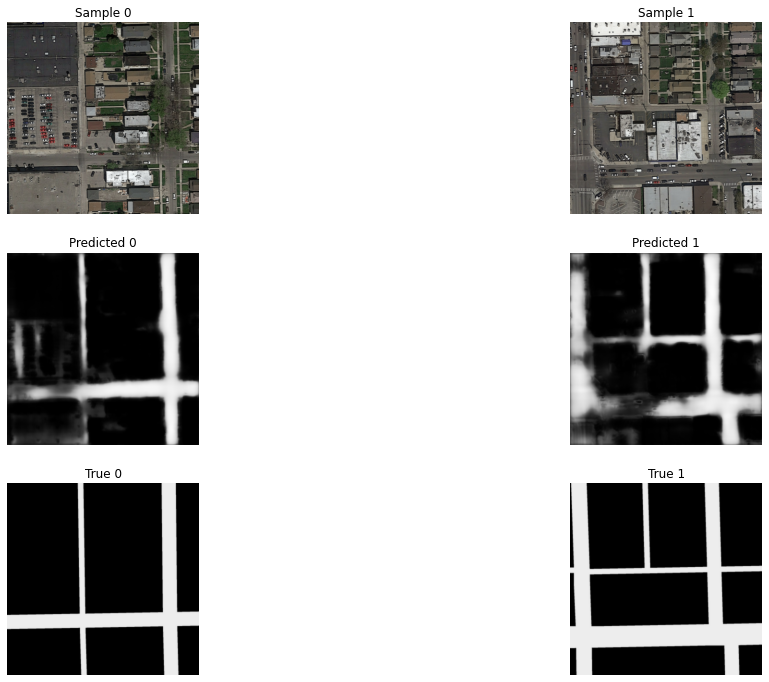


	- loss = 0.15275169039765993
  	- val_loss = 0.46911121904850006
  	- acc = 0.9483412355184555
  	- val_acc = 0.8288048803806305
  	- patch_acc = 0.9492549250523249
  	- val_patch_acc = 0.8146701455116272
 


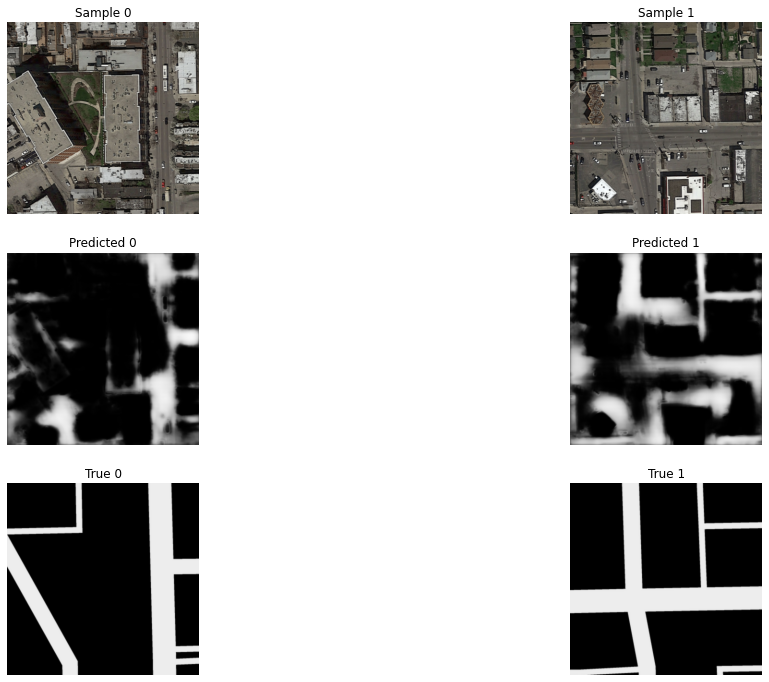


	- loss = 0.1518545343230168
  	- val_loss = 0.3143436312675476
  	- acc = 0.9483916709820429
  	- val_acc = 0.8723970949649811
  	- patch_acc = 0.9419668763875961
  	- val_patch_acc = 0.861870676279068
 


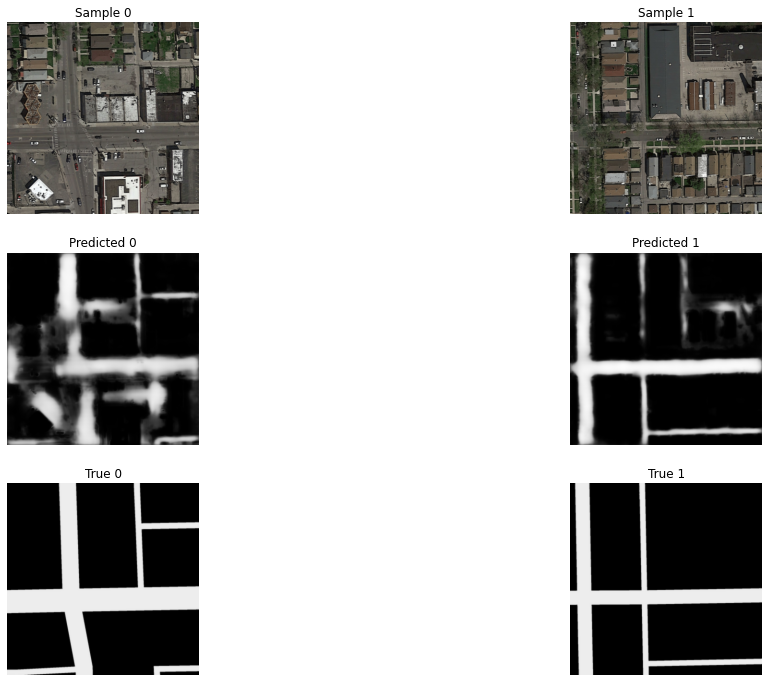


	- loss = 0.14553320532043776
  	- val_loss = 0.5046533346176147
  	- acc = 0.9522763788700104
  	- val_acc = 0.8272887468338013
  	- patch_acc = 0.9531250149011612
  	- val_patch_acc = 0.8119574785232544
 


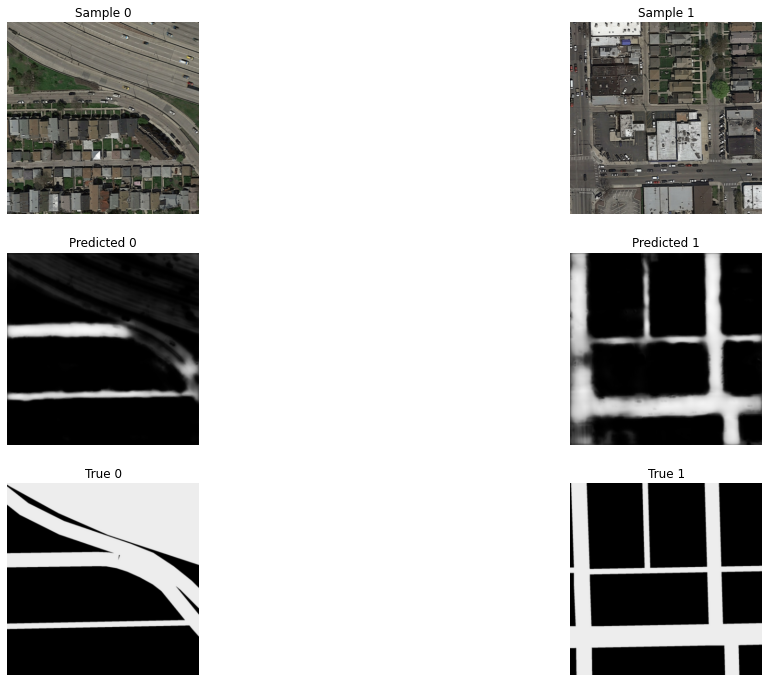


	- loss = 0.15041104642053446
  	- val_loss = 0.3935571312904358
  	- acc = 0.9508652985095978
  	- val_acc = 0.8642145693302155
  	- patch_acc = 0.9492006699244181
  	- val_patch_acc = 0.866319477558136
 


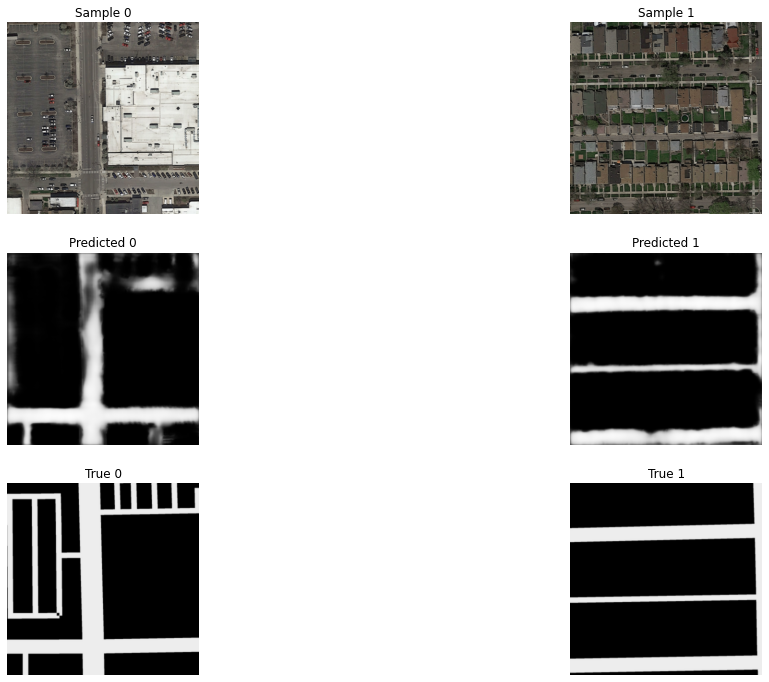


	- loss = 0.14539017466207346
  	- val_loss = 0.39484864473342896
  	- acc = 0.9526186337073644
  	- val_acc = 0.8536470234394073
  	- patch_acc = 0.9511176198720932
  	- val_patch_acc = 0.840277761220932
 


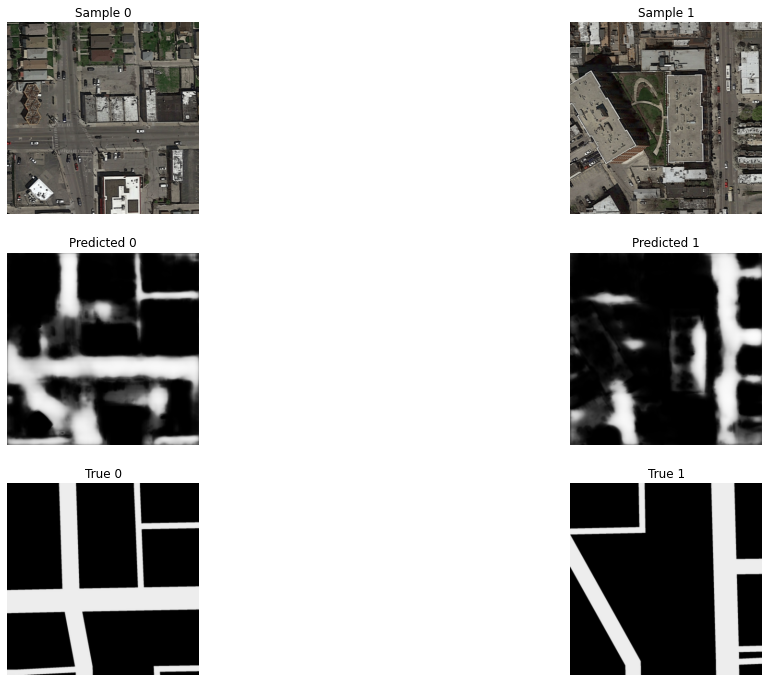


	- loss = 0.13627028030653796
  	- val_loss = 0.6792271435260773
  	- acc = 0.9564165870348612
  	- val_acc = 0.8364380896091461
  	- patch_acc = 0.9550600449244181
  	- val_patch_acc = 0.8248697817325592
 


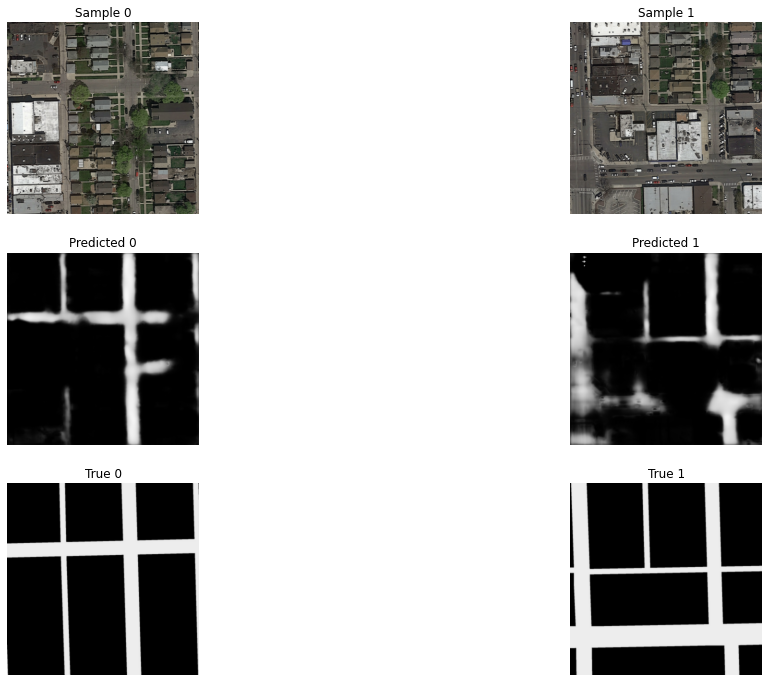


	- loss = 0.13227280229330063
  	- val_loss = 0.46246086061000824
  	- acc = 0.9577478567759196
  	- val_acc = 0.8291956782341003
  	- patch_acc = 0.9573206106821696
  	- val_patch_acc = 0.8355034589767456
 


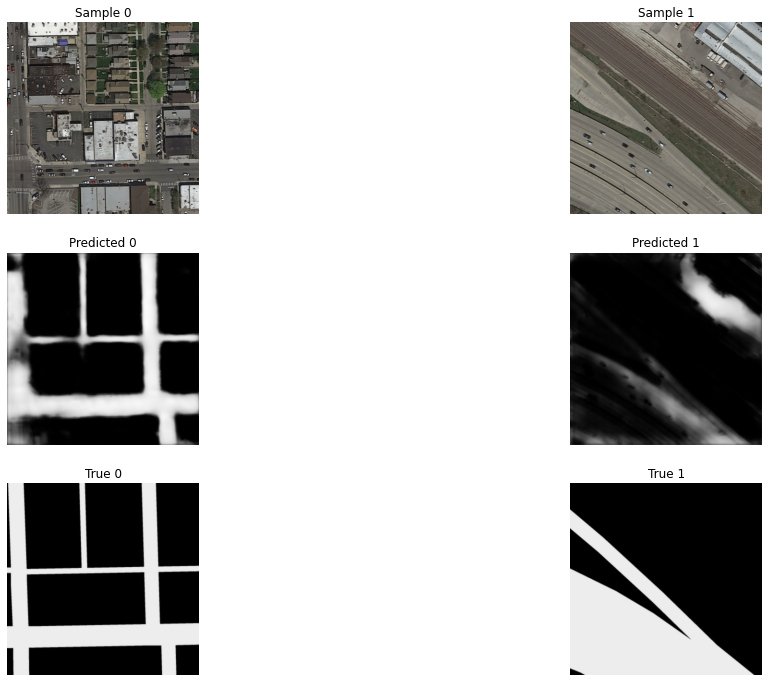


	- loss = 0.1390709454814593
  	- val_loss = 0.5061614066362381
  	- acc = 0.9565646648406982
  	- val_acc = 0.8334909975528717
  	- patch_acc = 0.9553674807151159
  	- val_patch_acc = 0.8236762285232544
 


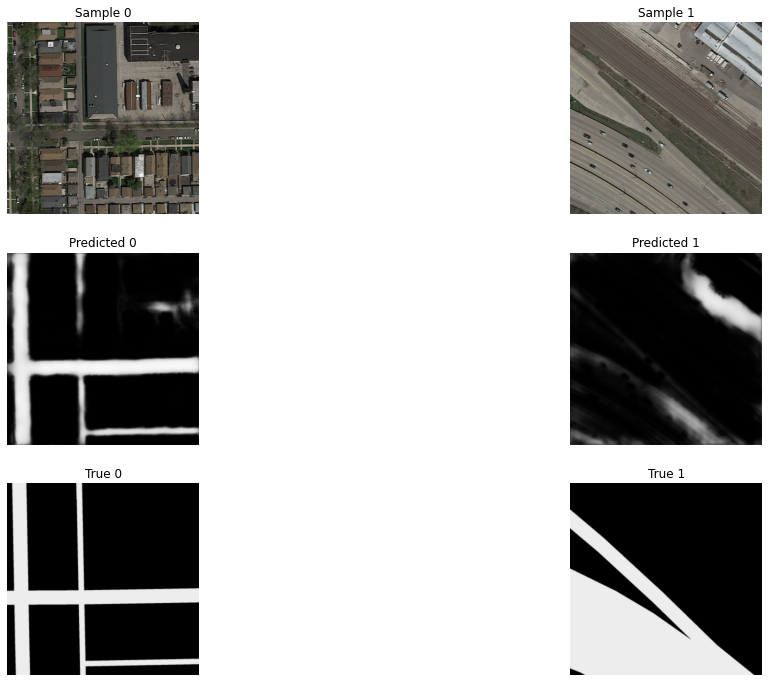


	- loss = 0.14799414140482745
  	- val_loss = 0.3785567209124565
  	- acc = 0.9502789676189423
  	- val_acc = 0.868462473154068
  	- patch_acc = 0.9457646210988363
  	- val_patch_acc = 0.8665364682674408
 


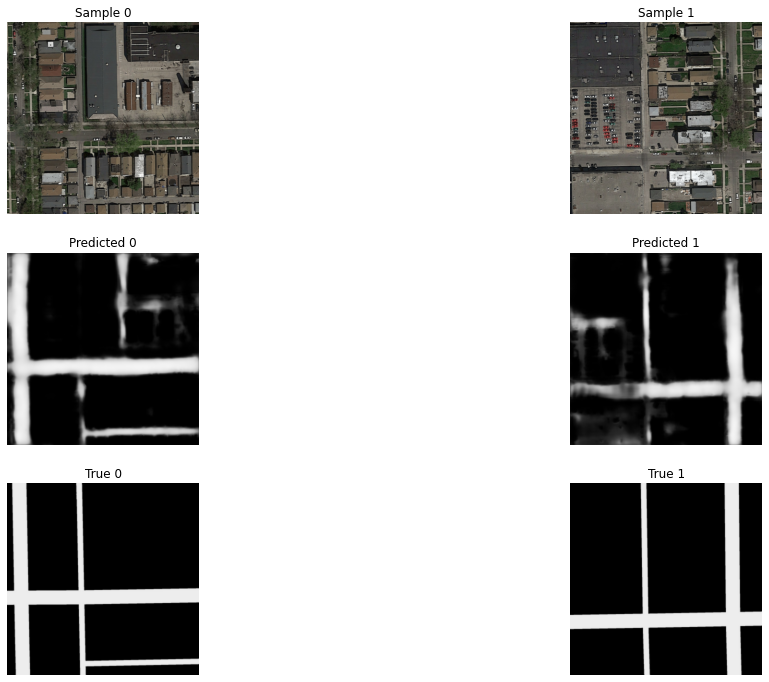


	- loss = 0.13412463230391344
  	- val_loss = 0.4607893079519272
  	- acc = 0.9571993152300516
  	- val_acc = 0.8192914426326752
  	- patch_acc = 0.9578088919321696
  	- val_patch_acc = 0.8235677182674408
 


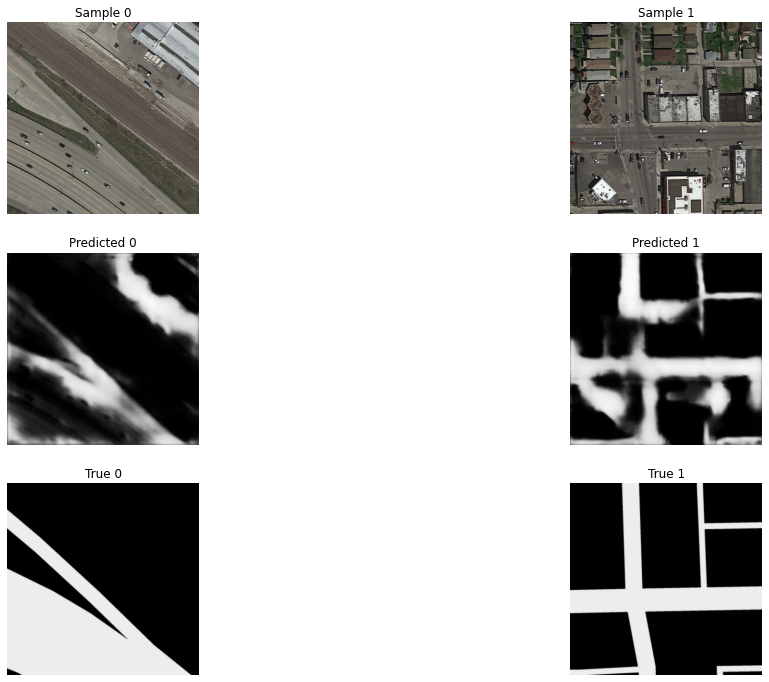


	- loss = 0.13113213454683623
  	- val_loss = 0.4582843482494354
  	- acc = 0.9585283795992533
  	- val_acc = 0.8434982299804688
  	- patch_acc = 0.9583152532577515
  	- val_patch_acc = 0.8382161557674408
 


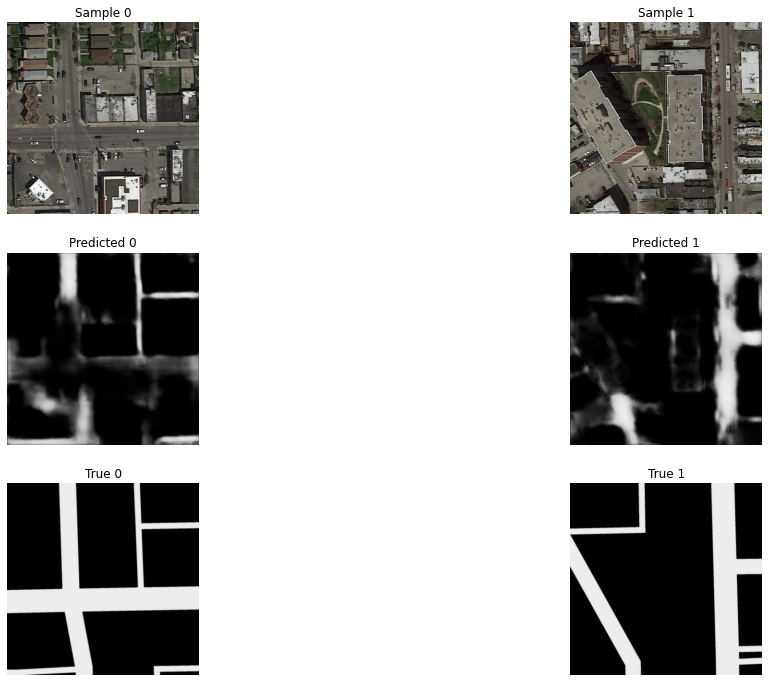


	- loss = 0.12831465154886246
  	- val_loss = 0.474217489361763
  	- acc = 0.9606030186017355
  	- val_acc = 0.8408783972263336
  	- patch_acc = 0.9599066923062006
  	- val_patch_acc = 0.8464626669883728
 


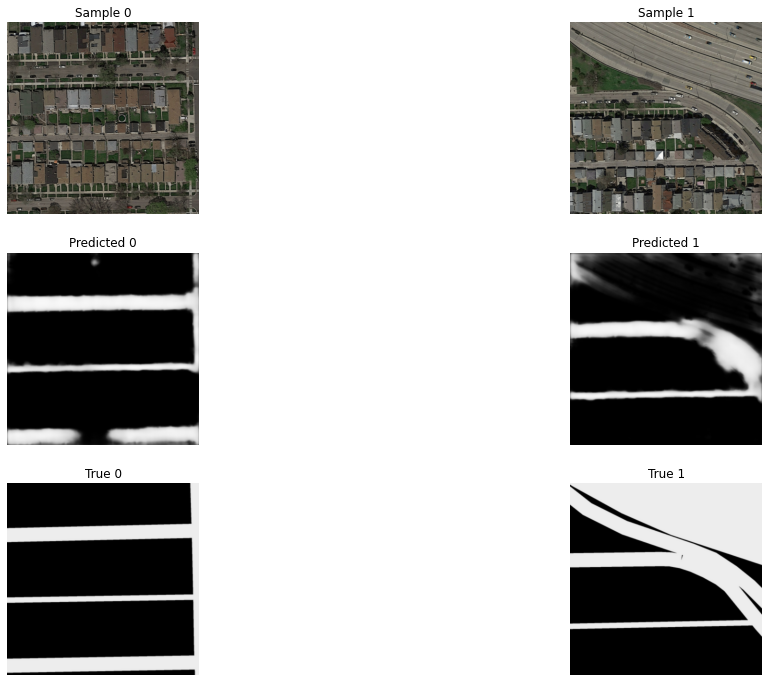


	- loss = 0.126322274406751
  	- val_loss = 0.5890028476715088
  	- acc = 0.9614387899637222
  	- val_acc = 0.8014348447322845
  	- patch_acc = 0.963252325852712
  	- val_patch_acc = 0.782769113779068
 


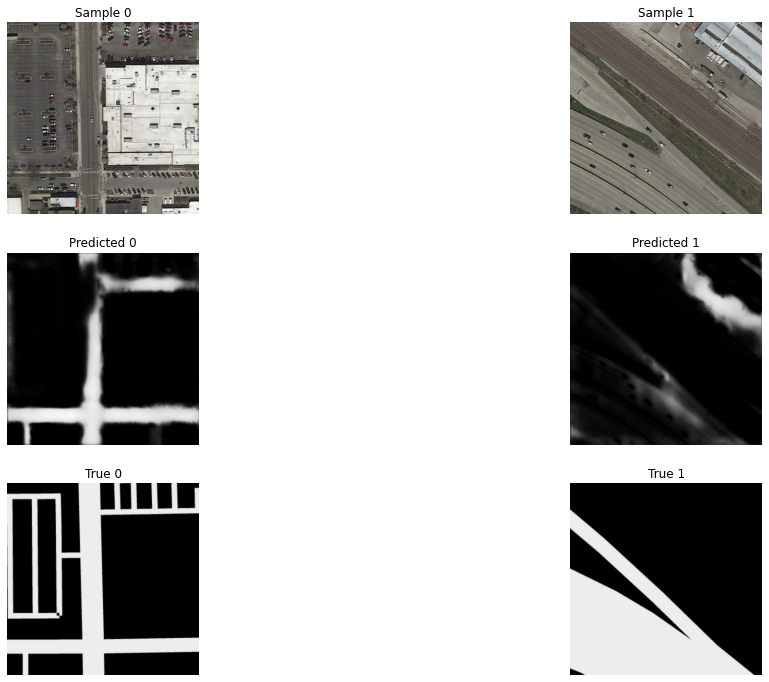

Finished Training


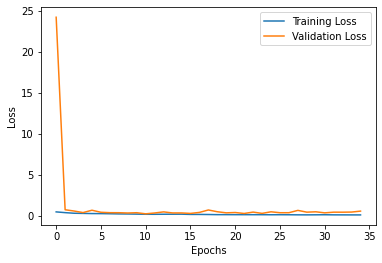

In [16]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# reshape the image to simplify the handling of skip connections and maxpooling
train_dataset = ImageDataset('training', device, use_patches=False, resize_to=(384, 384))
val_dataset = ImageDataset('validation', device, use_patches=False, resize_to=(384, 384))
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=True)
model = UNet().to(device)
loss_fn = nn.BCELoss()
metric_fns = {'acc': accuracy_fn, 'patch_acc': patch_accuracy_fn}
optimizer = torch.optim.Adam(model.parameters())
n_epochs = 35
train(train_dataloader, val_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs)

# predict on test set
test_filenames = (glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
batch_size = test_images.shape[0]
size = test_images.shape[1:3]
# we also need to resize the test images. This might not be the best ideas depending on their spatial resolution.
test_images = np.stack([cv2.resize(img, dsize=(384, 384)) for img in test_images], 0)
test_images = np_to_tensor(np.moveaxis(test_images, -1, 1), device)
test_pred = [model(t).detach().cpu().numpy() for t in test_images.unsqueeze(1)]
test_pred = np.concatenate(test_pred, 0)
test_pred= np.moveaxis(test_pred, 1, -1)  # CHW to HWC
test_pred = np.stack([cv2.resize(img, dsize=size) for img in test_pred], 0)  # resize to original shape
# now compute labels
test_pred = test_pred.reshape((-1, size[0] // PATCH_SIZE, PATCH_SIZE, size[0] // PATCH_SIZE, PATCH_SIZE))
test_pred = np.moveaxis(test_pred, 2, 3)
test_pred = np.round(np.mean(test_pred, (-1, -2)) > CUTOFF)
create_submission(test_pred, test_filenames, submission_filename='unet_submission.csv')

This final model should reach a similar accuracy compared to the previous one. While being held back by a simplistic implementation, in principle it should however represent a **more powerful approach**.
While it introduces some very important ideas, it is by no means close to state-of-the-art performance, and it can be completely outclassed by more powerful and newer methods. Moreover, many different elements are needed to reach good accuracy, and the right architecture is only one of them. Nevertheless, U-Net represents a good starting point for your project.

# Tips

In conclusion, we will go over some more or less specific tips for your project.

## On Road Segmentation

Domain specific knowledge can help in some practical applications. For this reason it is a good idea to research literature on this specific task. Even if methods might be outdated, some ideas could prove useful. Here is a couple of sources to get you started:

*   [Learning to Label Aerial Images from Noisy Data](https://www.cs.toronto.edu/~vmnih/docs/noisy_maps.pdf)
*   [DeepGlobe 2018: A Challenge to Parse the Earth through Satellite Images](https://www.researchgate.net/publication/325215555_DeepGlobe_2018_A_Challenge_to_Parse_the_Earth_through_Satellite_Images)


## On CNNs

Research on CNNs has grown at an intense pace  in recent years. Listing the most influential papers in this context would be a very hard task, so we will just cite a few important works with no claim of completeness. While some of the presented models might not be directly applicable, they introduce interesting ideas.

* [ResNet](https://arxiv.org/abs/1512.03385)
* [Fully Convolutional Networks for Semantic Segmentation](https://arxiv.org/pdf/1411.4038.pdf)
* [DeepLab v1](https://arxiv.org/abs/1606.00915) (v2, v3 and v3+ also exist)
* [PsPNet](https://arxiv.org/abs/1612.01105)

## Concrete Tips

* Explore the data in depth but **avoid information leakage**.

* Two fundamentals topics were skipped in this notebook, namely pre-processing and post-processing. Both are crucial to this project.

* Regarding **pre-processing**: we can apply transformations to our data. What transformations are effectively robustifying training without generating completely out of distribution samples?

* **Hyperparameter tuning** is a tedious process, but it can have massive impact on your work. You can tune batch sizes, change or schedule the learning rate, manage weight decay, change the optimizer or its parameters, just to name a few.

* The loss function drives the backpropagation process. BCELoss is probably the most immediate choice, but might not be the best one. You can look into Dice loss for instance.

* You do not have to reinvent the wheel and code everything from scratch. Open source implementations of existing models can be a good starting point. On the other hand, coding your own models can be helpful to you as a learner.

* While they might not be interesting for reviewers, methods like ensembling can help you in the competitive part.

* **Be clear about your contribution and choose baselines accordingly.**

# Getting started with the project
This final part is taken from the notebook introducing Project 1.

### Google Colab:

Colaboratory, or "Colab" for short, allows you to write and execute Python in your browser, with 
- Zero configuration required
- Free access to GPUs
- Easy sharing

[Introduction to Colab](https://www.youtube.com/watch?v=inN8seMm7UI) to learn more.

### ETH clusters

ETH provides access to the [Euler](https://scicomp.ethz.ch/wiki/Euler) and [Leonhard](https://scicomp.ethz.ch/wiki/Leonhard) cluster (see also [Getting started with clusters](https://scicomp.ethz.ch/wiki/Getting_started_with_clusters#SSH_keys)).

To start:
- Open [VPN](https://www.isg.inf.ethz.ch/Main/ServicesNetworkVPN)!
- [Setup SSH keys](https://scicomp.ethz.ch/wiki/Getting_started_with_clusters#SSH_keys) (only need to do that once).
- Can even run jupyter-notebooks via [this](https://scicomp.ethz.ch/wiki/Jupyter_on_Euler_and_Leonhard_Open). If you want to run with a GPU may need to change the file accordingly (line 64: "python_cpu/3.6.4" -> "python_gpu/x.x.x" see [this](https://scicomp.ethz.ch/wiki/Python_on_Leonhard) for available versions, line 139 to request a GPU change rusage demands). To see tensorboard results you can mount the remote directory
```
sshfs <ethz-username>@<cluster-hostname>:<directory>
```
and run tensorboard locally 
```
tensorboard --logdir <directory>
```